```python
file1 \_ |-----------------------------------|   -+-
file2 \_ |-----------------------------------|    |   training data
file3 \_ |-----------------------------------|    |        80%
file4 \_ |-----------------------------------|    |
                                                 -+-
file5 \_ |-----------------------------------|    |  validation data
file6 \_ |-----------------------------------|    |        20%
         |-----------------------------------|   -+-
```

In [1]:
import os
import glob

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

from utils.MovingAverager import *

# 讀檔

In [2]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time

def gen_total_mag(df: pd.DataFrame):
    
    df['mag_x'] = moving_average(df['mag_x'], 41)
    df['mag_y'] = moving_average(df['mag_y'], 41)
    df['mag_z'] = moving_average(df['mag_z'], 41)
    
    df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))
    
    return df

def load_original_data(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = total_df[:-5]  # remove last None value row
    total_df = rename_data(total_df)
    total_df = gen_total_mag(total_df)
    
    return total_df

In [3]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, chunk_size=5, seq_len=25):
    length = chunk_size * seq_len
    num_of_segs = int(np.floor(len(df) / length))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * length):int((i + 1) * length)].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
        
    return segments

def split_segments_overlap(df, chunk_size=5, seq_len=25):
    num_of_chunk = int(np.floor(len(df) / seq_len))
    
    segments = []
    for i in range(num_of_chunk - chunk_size):
        seg = df.iloc[int(i * seq_len):int((i + chunk_size) * seq_len)].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
        
    return segments

# def split_segments_overlap(df, chunk_size=5, seq_len=25):
#     total_length = chunk_size * seq_len
    
#     segments = []
#     for i in range(0, len(df) - total_length, 5):
#         seg = df.iloc[i:i + total_length].to_numpy()
#         segments.append(np.array(np.split(seg, chunk_size)))
        
#     return segments


def select_data(df):
    return df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'mag_x', 'mag_y', 'mag_z', 'mag_t', 'system_time']]


def preprocess_data(df, chunk_size=5, seq_len=25, is_train_data=False):
    pre_df = select_data(df)
    
    if is_train_data:
        segs = split_segments_overlap(pre_df, chunk_size, seq_len)
    else:
        segs = split_segments(pre_df, chunk_size, seq_len)
    
    return segs

In [4]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

#         print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num, file_index=None, is_train_data=False):
    prefix = 'train' if is_train_data else 'valid'
    pair_data = []
    folder_paths = glob.glob(f'*{os.path.normpath(root_folder)}/*')

    if file_index is not None:
        folder_paths = folder_paths[file_index[0]:file_index[1]]

    for i, folder_path in enumerate(folder_paths):
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        print(f'{prefix} {i + 1: >3}: {folder_path}')
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path)
        target_df = load_original_data(target_path)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = align_data(source_df, target_df)
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        
#         print(source_df.system_time[0], target_df.system_time[0])
#         print(source_df.system_time[len(source_df) - 1], target_df.system_time[len(target_df) - 1])
#         print(len(source_df), len(target_df))
        
#         plt.figure(figsize=(30, 5))
#         plt.plot(np.arange(len(source_df)), source_df.acc_x)
#         plt.plot(np.arange(len(target_df)), target_df.acc_y)
#         plt.show()
        
        source_segs = preprocess_data(source_df, chunk_size, seq_len, is_train_data)
        target_segs = preprocess_data(target_df, chunk_size, seq_len, is_train_data)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [5]:
datapoint_per_second = 20
duration = 2
chunk_size = 7
seq_len = 25
classes = {0: 'target', 1: 'front_pocket', 2: 'pocket', 3: 'swing'}

In [6]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [7]:
train_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[0, 8], is_train_data=True)
valid_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[8, 10], is_train_data=False)

train_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[0, 8], is_train_data=True)
valid_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[8, 10], is_train_data=False)

train_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[0, 8], is_train_data=True)
valid_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[8, 10], is_train_data=False)

train   1: front_pocket/202302071628
train   2: front_pocket/202302071652
train   3: front_pocket/202302071523
train   4: front_pocket/202302071531
train   5: front_pocket/202302071715
train   6: front_pocket/202302071641
train   7: front_pocket/202302071541
train   8: front_pocket/202302071619
valid   1: front_pocket/202302071704
valid   2: front_pocket/202302071724
train   1: pocket/202302132108
train   2: pocket/202302131750
train   3: pocket/202302131601
train   4: pocket/202302071606
train   5: pocket/202302132053
train   6: pocket/202302122132
train   7: pocket/202302132116
train   8: pocket/202302131643
valid   1: pocket/202301101952
valid   2: pocket/202302132101
train   1: swing/202302142339
train   2: swing/202302132131
train   3: swing/202302142117
train   4: swing/202302132124
train   5: swing/202302121947
train   6: swing/202302121857
train   7: swing/202302142128
train   8: swing/202302121920
valid   1: swing/202302121909
valid   2: swing/202302142331


In [8]:
print(len(train_front_pocket_pair_data), len(train_pocket_pair_data), len(train_swing_pair_data))

1788 1748 1684


In [9]:
train_front_pocket_pair_data[0][0][0, -1], train_front_pocket_pair_data[0][2][0, -1]

(array([ 4.08018416e-01, -1.88228362e+00, -2.25128342e+00, -5.40463984e-01,
        -1.87591553e+00,  5.90145647e-01,  1.60005878e+01, -1.49559553e+01,
         3.60812065e+01,  4.22084455e+01,  1.67575812e+09]),
 array([ 3.23165961e-01,  9.69002332e-01,  1.22304923e+00,  2.38888234e-01,
        -1.13709919e-01,  3.30951400e-02, -3.67468223e+01, -2.82494801e-01,
        -2.19929452e+01,  4.28263749e+01,  1.67575811e+09]))

# 建立dataloader

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [11]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [12]:
class FirstDerivativeLoss(nn.Module):
    def __init__(self, weight=None, size_average=None, reduce=None, reduction='mean', chunk_size=5):
        super(FirstDerivativeLoss, self).__init__()
        self.chunk_size = chunk_size

    def forward(self, source, target):
        # calculate the first derivative
        source_o = torch.reshape(source, (len(source), self.chunk_size, -1))
        target_o = torch.reshape(target, (len(target), self.chunk_size, -1))
        d_source = source_o[1:] - source_o[:-1]
        d_target = target_o[1:] - target_o[:-1]
        deriv = d_source - d_target

        # calculate the loss as the mean squared error of the derivative
        loss = torch.mean(torch.pow(deriv, 2))

        return loss

In [13]:
def generator_loss(z_imu, target_imu, predict_mag, target_mag, source_total_mag, target_total_mag):
    imu_loss = mse_loss(z_imu, target_imu)
    mag_loss = mse_loss(predict_mag, target_mag)
    d1_loss = div_loss(predict_mag, target_mag)
    
    pred_total_mag = torch.sqrt(torch.sum(torch.pow(predict_mag, 2), dim=-1))
    
    smag_limitation_loss = torch.mean(torch.abs(pred_total_mag - source_total_mag))
    tmag_limitation_loss = torch.mean(torch.abs(pred_total_mag - target_total_mag))

    total_loss = imu_loss + mag_loss * 2 + d1_loss + smag_limitation_loss * 0.5 + tmag_limitation_loss * 1.5
    
    return total_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss)

# def discriminator_loss(d_real, d_fake):
#     real_loss = bce_loss(d_real, torch.ones_like(d_real))
#     fake_loss = bce_loss(d_fake, torch.zeros_like(d_fake))

#     return real_loss + fake_loss

In [14]:
train_data = train_front_pocket_pair_data + train_pocket_pair_data + train_swing_pair_data
valid_data = valid_front_pocket_pair_data + valid_pocket_pair_data + valid_swing_pair_data

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=512)

In [15]:
batch = next(iter(train_loader))

In [25]:
EPOCH = 6000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()
bce_loss = torch.nn.BCELoss()
div_loss = FirstDerivativeLoss(chunk_size=chunk_size)

In [26]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [27]:
class Classifier(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(Classifier, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.cnn = nn.Sequential(
            nn.Conv1d(6, 16, kernel_size=5),
            nn.LeakyReLU(),
            nn.Conv1d(16, 16, kernel_size=5),
            nn.LeakyReLU(),
        )
        
        # 16 * (seq_len-8)
        self.rnn = nn.RNN(input_size=16 * (seq_len - 8), hidden_size=64, num_layers=2, batch_first=True)
        
        self.last = nn.Sequential(
            nn.Linear(64, 16),
            nn.Tanh(),
            nn.Linear(16, num_of_classes),
            nn.Softmax(dim=2),
        )
        
    def forward(self, x):  # input: (bs, chunk_size, seq_len, 9)
        h = torch.reshape(x, (len(x) * self.chunk_size, self.seq_len, -1))  # (bs, chunk_size, seq_len, 9) -> (bs * chunk_size, seq_len, 9)
        h = torch.permute(h, (0, 2, 1))  # (bs * chunk_size, seq_len, 9) -> (bs * chunk_size, 9, seq_len) [CNN要對最後一個維度做卷積]
        
        h = self.cnn(h)

        h = torch.permute(h, (0, 2, 1))
        h = torch.reshape(h, (len(x), self.chunk_size, -1))
        
        hz, _ = self.rnn(h)
        out = self.last(hz)

        out = torch.reshape(out, (len(x), self.chunk_size, self.num_of_classes))
        
        return out, hz
    

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.imu_layer = nn.Sequential(
            nn.Linear(6, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 64),
            nn.LeakyReLU(),
        )
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        self.pos_encoder = PositionalEncoding(64 * self.seq_len, 0.1)
        
        self.encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        self.nn = nn.Sequential(
            nn.Linear(64, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 6),
            nn.LeakyReLU(),
        )
        
        self.decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64* self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        
        self.mag_last = nn.Sequential(
            nn.Linear(64, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 3),
        )
        
    def forward(self, source_imu, source_mag):
        
        ### step 1
        h_imu = self.imu_layer(source_imu)
        h_imu = h_imu.reshape((len(source_imu), self.chunk_size, -1))
        h_imu = self.pos_encoder(h_imu)
        
        h_mag = self.mag_layer(source_mag)
        h_mag = h_mag.reshape((len(source_mag), self.chunk_size, -1))
        h_mag = self.pos_encoder(h_mag)
        
        ### step 2
        z = self.encoder(h_imu)
        z_imu = z.reshape((len(source_imu), self.chunk_size, self.seq_len, -1))
        z_imu = self.nn(z_imu)
        
        ### step 3
        pred_latent = self.decoder(h_mag, z)
        pred_mag = pred_latent.reshape((len(source_mag), self.chunk_size, self.seq_len, -1))
        pred_mag = self.mag_last(pred_mag)
        
        
        return z_imu, pred_mag
        

In [28]:
model = NotSimpleTransformer(chunk_size=chunk_size, seq_len=seq_len, num_of_classes=num_of_classes).to(device)
# discriminator = Discriminator(chunk_size=chunk_size, seq_len=seq_len).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)
# optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.000025)

In [29]:
from torchinfo import summary
summary(model, input_size=[(1, 7, 25, 6), (1, 7, 25, 3)])

Layer (type:depth-idx)                        Output Shape              Param #
NotSimpleTransformer                          [1, 7, 25, 6]             --
├─Sequential: 1-1                             [1, 7, 25, 64]            --
│    └─Linear: 2-1                            [1, 7, 25, 32]            224
│    └─LeakyReLU: 2-2                         [1, 7, 25, 32]            --
│    └─Linear: 2-3                            [1, 7, 25, 64]            2,112
│    └─LeakyReLU: 2-4                         [1, 7, 25, 64]            --
├─PositionalEncoding: 1-2                     [1, 7, 1600]              --
│    └─Dropout: 2-5                           [1, 7, 1600]              --
├─Sequential: 1-3                             [1, 7, 25, 64]            --
│    └─Linear: 2-6                            [1, 7, 25, 16]            64
│    └─LeakyReLU: 2-7                         [1, 7, 25, 16]            --
│    └─Linear: 2-8                            [1, 7, 25, 64]            1,088
│    └─LeakyR

In [30]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
        
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [31]:
def train(dataloader, draw=False):
    model.train()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []

    for source_data, source_label, target_data, target_label in dataloader:
        optimizer.zero_grad()

        source_data = source_data.to(device)
        source_imu = source_data[:, :, :, :6]
        source_mag = source_data[:, :, :, 6:9]
        source_total_mag = source_data[:, :, :, 9]
        
        target_data = target_data.to(device)
        target_imu = target_data[:, :, :, :6]
        target_mag = target_data[:, :, :, 6:9]
        target_total_mag = target_data[:, :, :, 9]

        # generate mag
        z_imu, predict_mag = model(source_imu, source_mag)
        
        # generator loss
        gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag, source_total_mag, target_total_mag)
        
        # backward
        gen_loss.backward()
        optimizer.step()
        
        # record loss
        g_losses.append(gen_loss.item())
        imu_losses.append(imu_loss.item())
        mag_losses.append(mag_loss.item())
        d1_losses.append(d1_loss.item())
        lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)

    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

In [32]:
def evalute(dataloader, draw=False):
    model.eval()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :, :6]
            source_mag = source_data[:, :, :, 6:9]
            source_total_mag = source_data[:, :, :, 9]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :, :6]
            target_mag = target_data[:, :, :, 6:9]
            target_total_mag = target_data[:, :, :, 9]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # generator loss
            gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                                  source_total_mag, target_total_mag)

            # record loss
            g_losses.append(gen_loss.item())
            imu_losses.append(imu_loss.item())
            mag_losses.append(mag_loss.item())
            d1_losses.append(d1_loss.item())
            lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

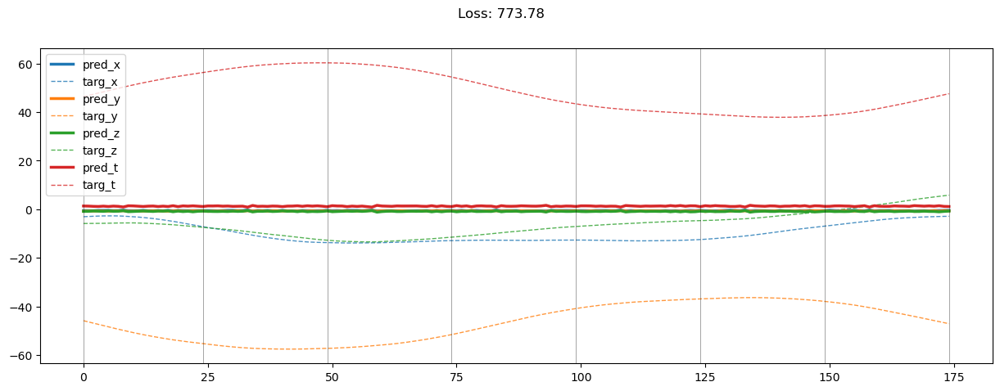

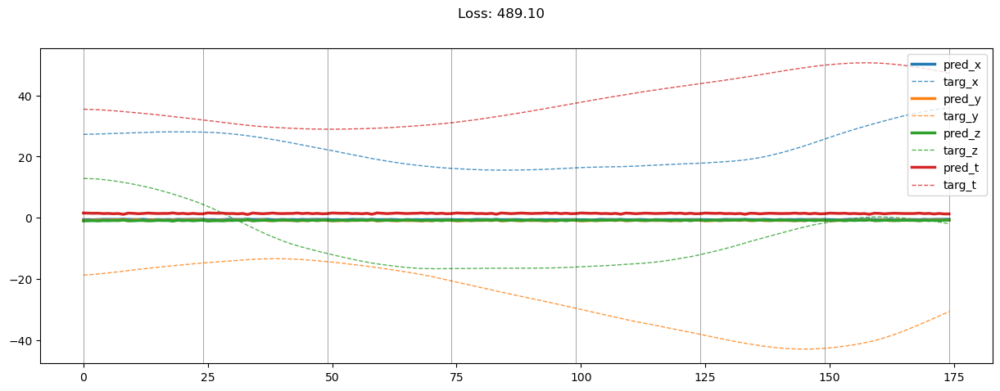

00020: train loss:  2095.187, imu loss:  0.685, mag loss:  595.778, div loss:  822.784, slim:  39.467, tlim:  40.286
       valid loss:  1723.484, imu loss:  0.516, mag loss:  593.242, div loss:  456.238, slim:  39.674, tlim:  40.273
00040: train loss:  1983.097, imu loss:  0.677, mag loss:  569.802, div loss:  765.151, slim:  38.227, tlim:  39.035
       valid loss:  1645.091, imu loss:  0.513, mag loss:  569.485, div loss:  427.952, slim:  38.380, tlim:  38.978
00060: train loss:  1869.960, imu loss:  0.676, mag loss:  539.877, div loss:  714.787, slim:  36.762, tlim:  37.575
       valid loss:  1560.251, imu loss:  0.512, mag loss:  541.860, div loss:  401.401, slim:  36.860, tlim:  37.459
00080: train loss:  1755.531, imu loss:  0.680, mag loss:  508.520, div loss:  666.156, slim:  35.248, tlim:  36.021
       valid loss:  1468.015, imu loss:  0.512, mag loss:  510.466, div loss:  375.233, slim:  35.220, tlim:  35.819
00100: train loss:  1615.003, imu loss:  0.670, mag loss:  467.5

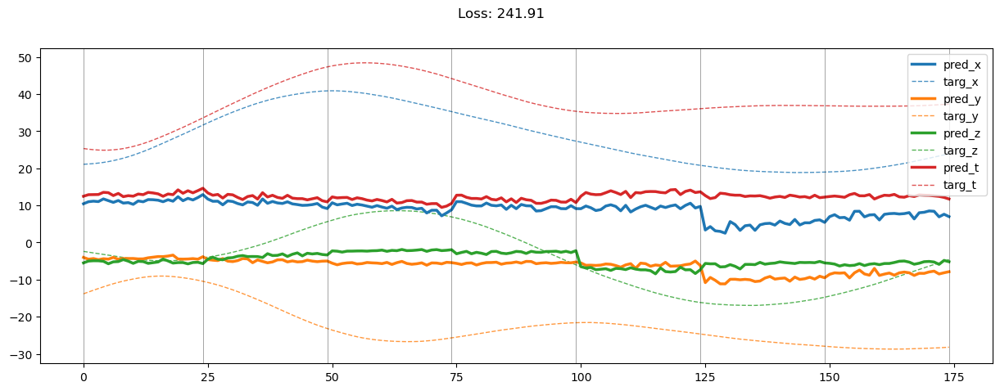

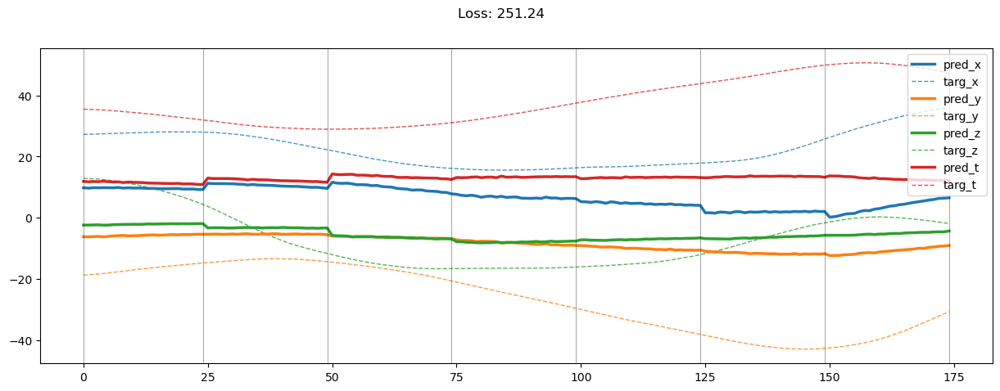

00200: train loss:  934.474, imu loss:  0.679, mag loss:  264.495, div loss:  359.861, slim:  22.052, tlim:  22.612
       valid loss:  854.600, imu loss:  0.512, mag loss:  286.756, div loss:  235.562, slim:  22.284, tlim:  22.582
00220: train loss:  812.099, imu loss:  0.676, mag loss:  227.573, div loss:  315.808, slim:  19.908, tlim:  20.343
       valid loss:  754.036, imu loss:  0.512, mag loss:  250.541, div loss:  212.151, slim:  20.015, tlim:  20.190
00240: train loss:  708.661, imu loss:  0.680, mag loss:  196.313, div loss:  278.988, slim:  17.927, tlim:  18.269
       valid loss:  673.929, imu loss:  0.512, mag loss:  220.422, div loss:  196.419, slim:  18.012, tlim:  18.099
00260: train loss:  610.715, imu loss:  0.680, mag loss:  168.609, div loss:  240.182, slim:  16.157, tlim:  16.371
       valid loss:  607.917, imu loss:  0.512, mag loss:  197.489, div loss:  180.052, slim:  16.150, tlim:  16.200
00280: train loss:  522.856, imu loss:  0.676, mag loss:  141.553, div l

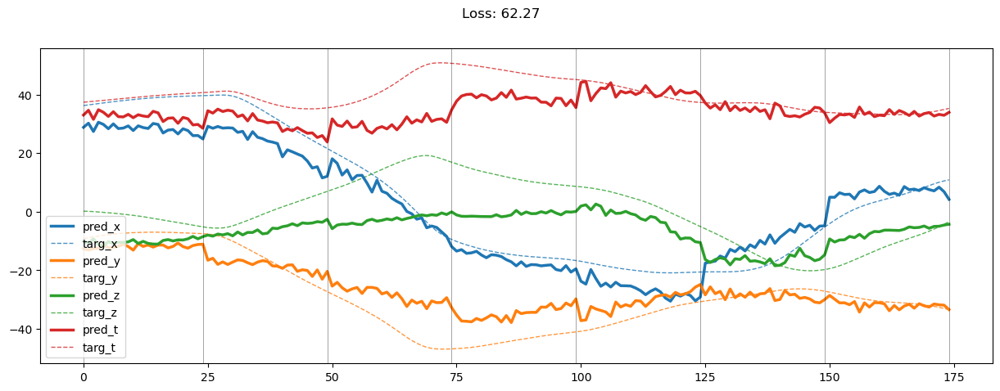

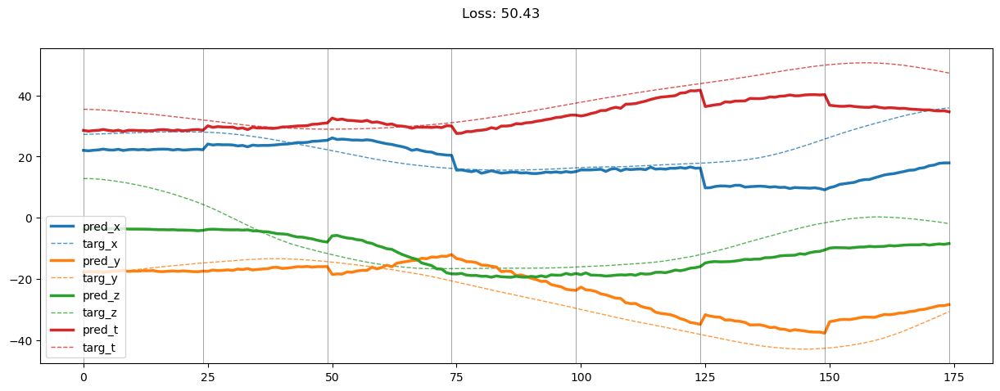

00400: train loss:  192.657, imu loss:  0.671, mag loss:  48.070, div loss:  81.801, slim:  7.751, tlim:  6.780
       valid loss:  308.235, imu loss:  0.511, mag loss:  91.933, div loss:  109.539, slim:  7.440, tlim:  7.066
00420: train loss:  164.908, imu loss:  0.675, mag loss:  40.371, div loss:  70.837, slim:  7.150, tlim:  6.052
       valid loss:  284.124, imu loss:  0.511, mag loss:  84.656, div loss:  101.309, slim:  6.810, tlim:  6.391
00440: train loss:  140.247, imu loss:  0.681, mag loss:  33.699, div loss:  60.847, slim:  6.576, tlim:  5.355
       valid loss:  263.342, imu loss:  0.511, mag loss:  78.057, div loss:  94.959, slim:  6.243, tlim:  5.759
00460: train loss:  120.251, imu loss:  0.677, mag loss:  28.416, div loss:  52.470, slim:  6.230, tlim:  4.772
       valid loss:  255.581, imu loss:  0.511, mag loss:  76.411, div loss:  91.174, slim:  5.867, tlim:  5.427
00480: train loss:  103.967, imu loss:  0.676, mag loss:  24.221, div loss:  45.438, slim:  5.862, tli

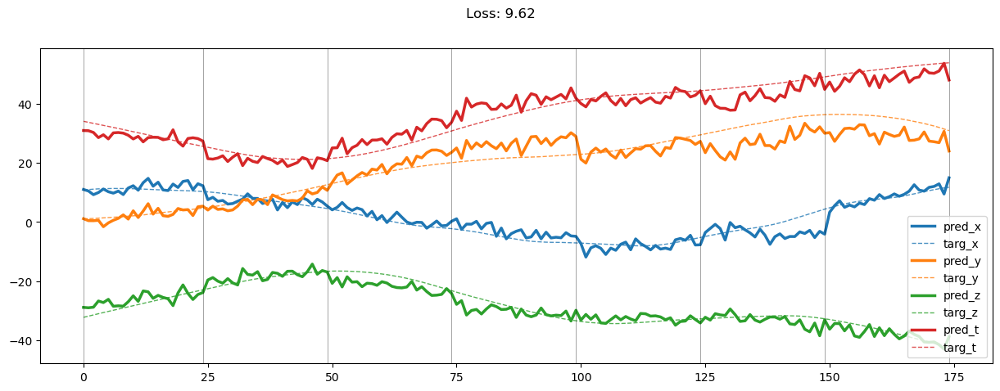

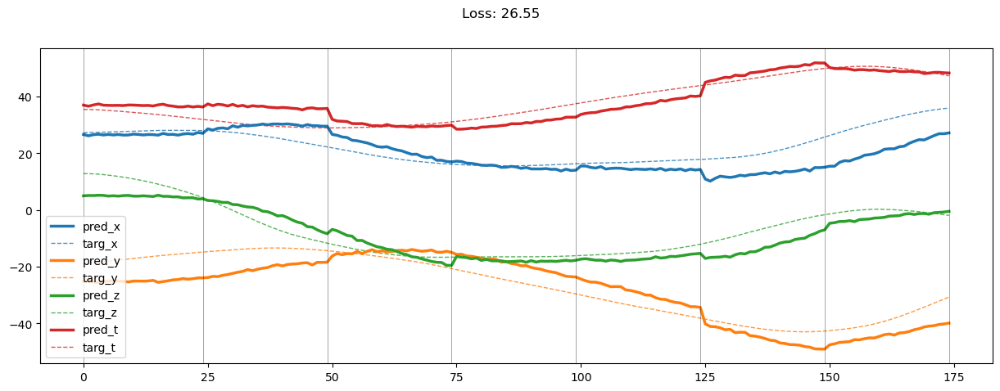

00600: train loss:  57.841, imu loss:  0.679, mag loss:  12.728, div loss:  24.920, slim:  4.938, tlim:  2.878
       valid loss:  201.552, imu loss:  0.510, mag loss:  59.604, div loss:  72.864, slim:  4.794, tlim:  4.381
00620: train loss:  53.703, imu loss:  0.672, mag loss:  11.714, div loss:  23.037, slim:  4.884, tlim:  2.749
       valid loss:  200.612, imu loss:  0.510, mag loss:  59.507, div loss:  72.057, slim:  4.811, tlim:  4.418
00640: train loss:  50.520, imu loss:  0.677, mag loss:  10.943, div loss:  21.578, slim:  4.810, tlim:  2.650
       valid loss:  198.138, imu loss:  0.510, mag loss:  58.042, div loss:  72.633, slim:  4.702, tlim:  4.373
00660: train loss:  46.817, imu loss:  0.676, mag loss:  10.069, div loss:  19.818, slim:  4.738, tlim:  2.543
       valid loss:  195.025, imu loss:  0.510, mag loss:  57.313, div loss:  70.993, slim:  4.724, tlim:  4.356
00680: train loss:  44.430, imu loss:  0.672, mag loss:  9.544, div loss:  18.626, slim:  4.731, tlim:  2.45

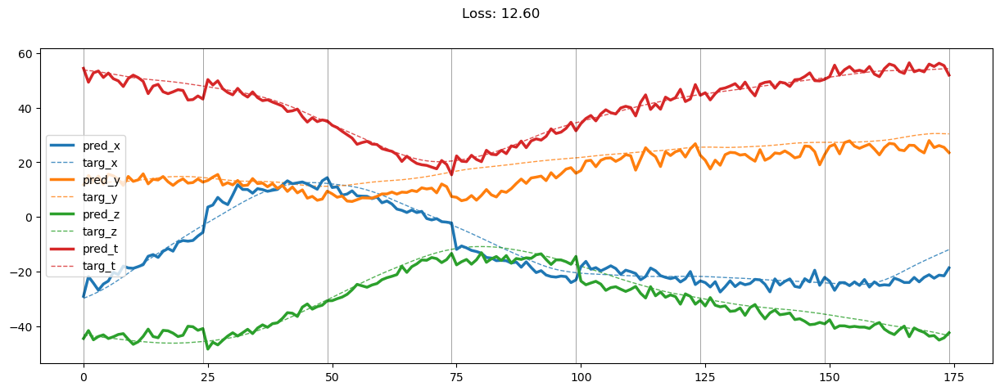

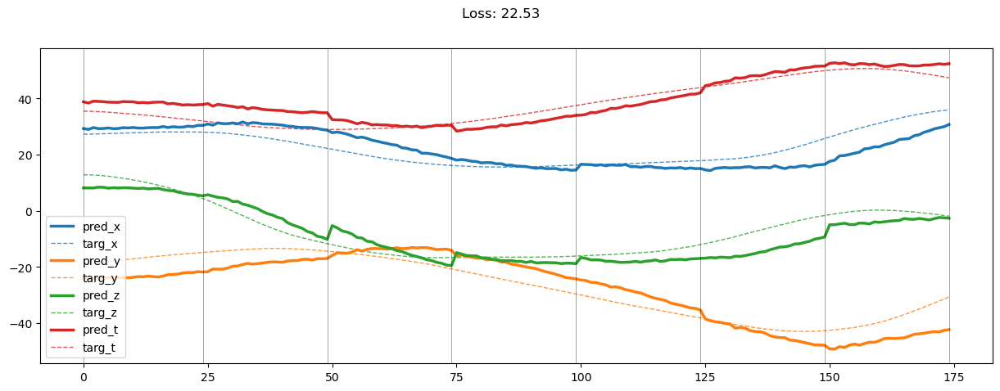

00800: train loss:  33.743, imu loss:  0.678, mag loss:  6.925, div loss:  13.777, slim:  4.561, tlim:  2.106
       valid loss:  188.187, imu loss:  0.510, mag loss:  55.216, div loss:  68.362, slim:  4.780, tlim:  4.328
00820: train loss:  31.776, imu loss:  0.677, mag loss:  6.485, div loss:  12.838, slim:  4.534, tlim:  2.015
       valid loss:  193.608, imu loss:  0.510, mag loss:  57.699, div loss:  68.943, slim:  4.698, tlim:  4.273
00840: train loss:  30.834, imu loss:  0.678, mag loss:  6.258, div loss:  12.405, slim:  4.531, tlim:  1.980
       valid loss:  185.337, imu loss:  0.510, mag loss:  54.873, div loss:  66.337, slim:  4.676, tlim:  4.270
00860: train loss:  29.474, imu loss:  0.676, mag loss:  5.938, div loss:  11.758, slim:  4.533, tlim:  1.931
       valid loss:  185.155, imu loss:  0.510, mag loss:  54.356, div loss:  67.158, slim:  4.705, tlim:  4.282
00880: train loss:  28.683, imu loss:  0.672, mag loss:  5.738, div loss:  11.433, slim:  4.502, tlim:  1.901
  

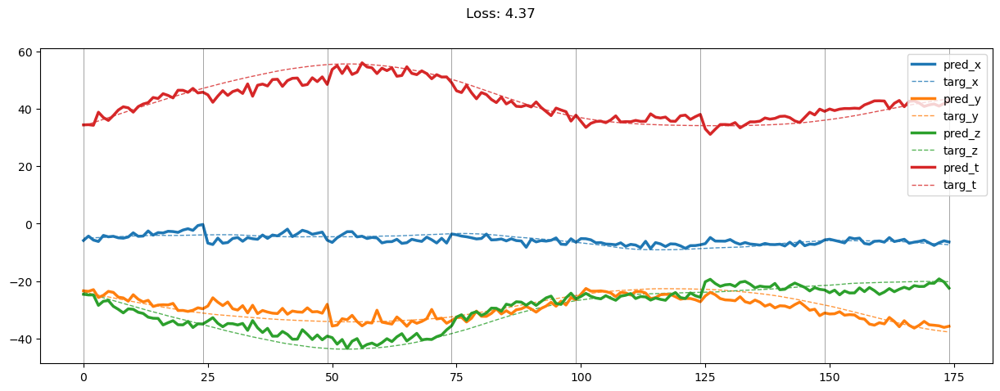

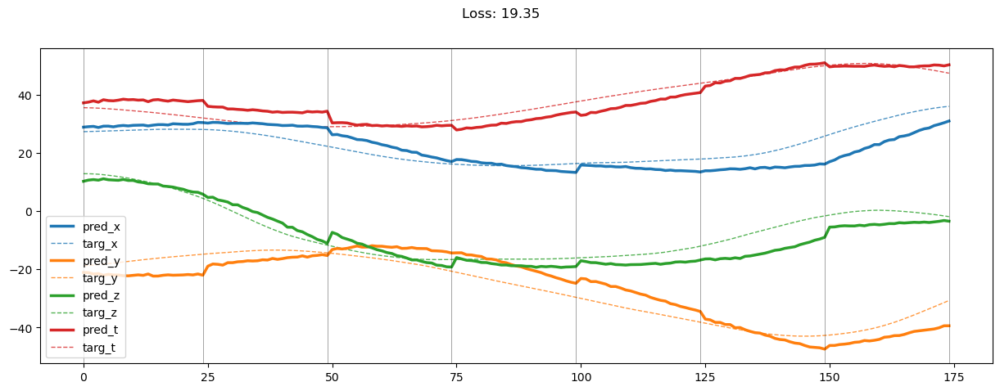

01000: train loss:  24.197, imu loss:  0.680, mag loss:  4.678, div loss:  9.326, slim:  4.463, tlim:  1.735
       valid loss:  186.648, imu loss:  0.510, mag loss:  55.309, div loss:  66.492, slim:  4.856, tlim:  4.401
01020: train loss:  23.520, imu loss:  0.675, mag loss:  4.534, div loss:  9.009, slim:  4.457, tlim:  1.693
       valid loss:  185.937, imu loss:  0.510, mag loss:  54.514, div loss:  67.634, slim:  4.678, tlim:  4.284
01040: train loss:  23.169, imu loss:  0.682, mag loss:  4.443, div loss:  8.850, slim:  4.456, tlim:  1.682
       valid loss:  183.093, imu loss:  0.510, mag loss:  53.616, div loss:  66.487, slim:  4.792, tlim:  4.312
01060: train loss:  22.551, imu loss:  0.680, mag loss:  4.291, div loss:  8.550, slim:  4.505, tlim:  1.658
       valid loss:  182.021, imu loss:  0.510, mag loss:  53.093, div loss:  66.629, slim:  4.710, tlim:  4.228
01080: train loss:  21.943, imu loss:  0.673, mag loss:  4.153, div loss:  8.290, slim:  4.448, tlim:  1.633
       

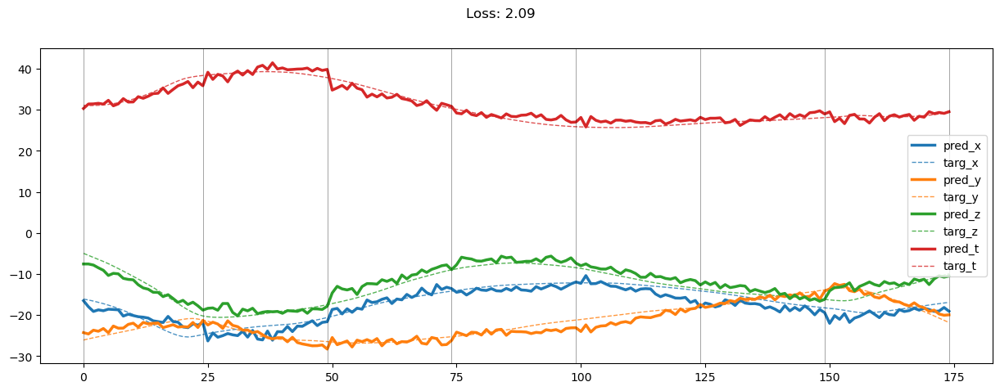

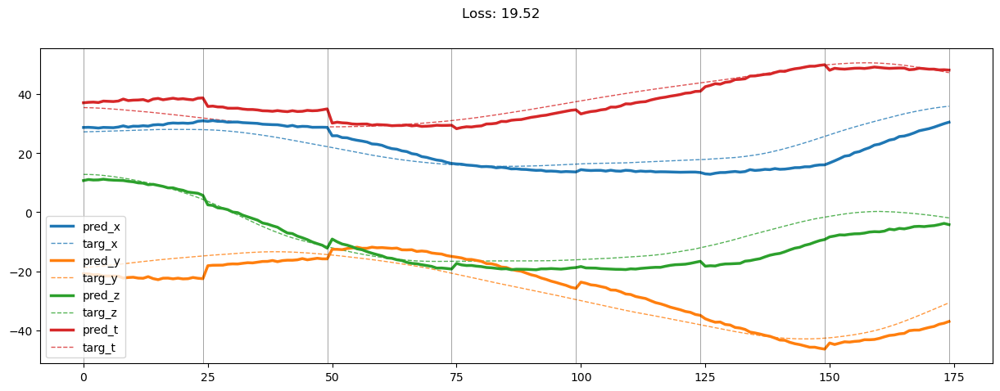

01200: train loss:  19.608, imu loss:  0.676, mag loss:  3.616, div loss:  7.210, slim:  4.402, tlim:  1.526
       valid loss:  186.804, imu loss:  0.510, mag loss:  54.418, div loss:  68.526, slim:  4.844, tlim:  4.340
01220: train loss:  19.298, imu loss:  0.676, mag loss:  3.547, div loss:  7.054, slim:  4.432, tlim:  1.505
       valid loss:  182.786, imu loss:  0.510, mag loss:  53.158, div loss:  67.107, slim:  4.885, tlim:  4.274
01240: train loss:  19.063, imu loss:  0.678, mag loss:  3.485, div loss:  6.969, slim:  4.437, tlim:  1.485
       valid loss:  181.609, imu loss:  0.510, mag loss:  52.485, div loss:  67.315, slim:  4.792, tlim:  4.280
01260: train loss:  18.627, imu loss:  0.675, mag loss:  3.388, div loss:  6.761, slim:  4.416, tlim:  1.472
       valid loss:  189.888, imu loss:  0.510, mag loss:  55.756, div loss:  68.841, slim:  4.914, tlim:  4.379
01280: train loss:  18.465, imu loss:  0.680, mag loss:  3.346, div loss:  6.672, slim:  4.448, tlim:  1.463
       

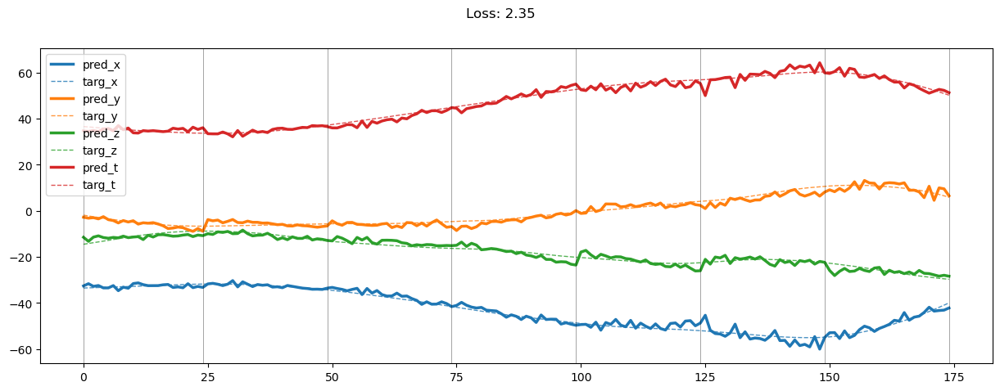

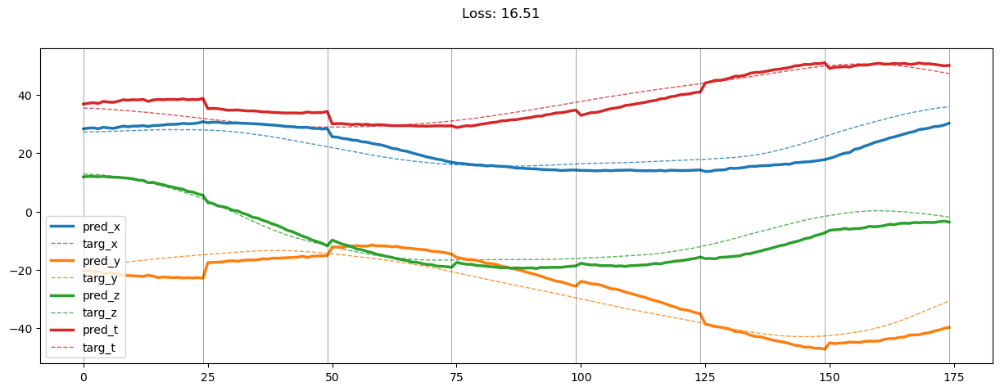

01400: train loss:  17.029, imu loss:  0.675, mag loss:  3.025, div loss:  6.025, slim:  4.372, tlim:  1.395
       valid loss:  183.665, imu loss:  0.510, mag loss:  53.158, div loss:  67.763, slim:  4.916, tlim:  4.412
01420: train loss:  16.662, imu loss:  0.672, mag loss:  2.941, div loss:  5.860, slim:  4.387, tlim:  1.369
       valid loss:  187.625, imu loss:  0.510, mag loss:  54.352, div loss:  69.204, slim:  4.974, tlim:  4.480
01440: train loss:  16.805, imu loss:  0.676, mag loss:  2.974, div loss:  5.903, slim:  4.410, tlim:  1.382
       valid loss:  186.775, imu loss:  0.509, mag loss:  54.465, div loss:  68.113, slim:  5.052, tlim:  4.464
01460: train loss:  16.402, imu loss:  0.677, mag loss:  2.878, div loss:  5.732, slim:  4.407, tlim:  1.355
       valid loss:  185.673, imu loss:  0.509, mag loss:  53.620, div loss:  68.880, slim:  4.898, tlim:  4.397
01480: train loss:  16.216, imu loss:  0.677, mag loss:  2.832, div loss:  5.655, slim:  4.406, tlim:  1.344
       

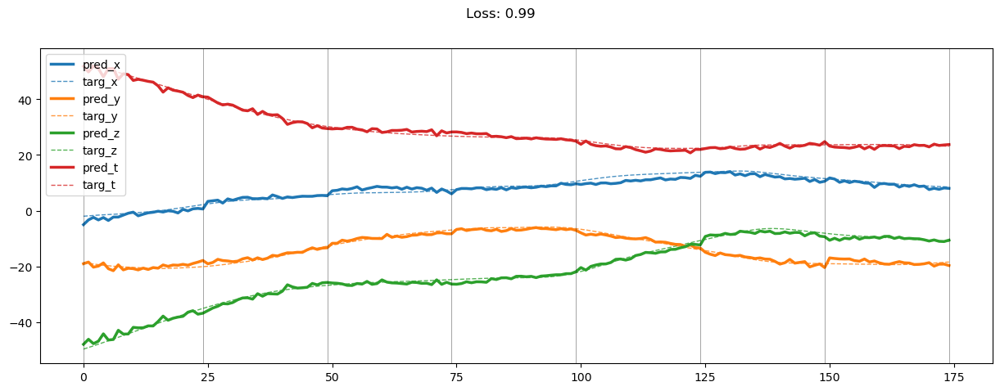

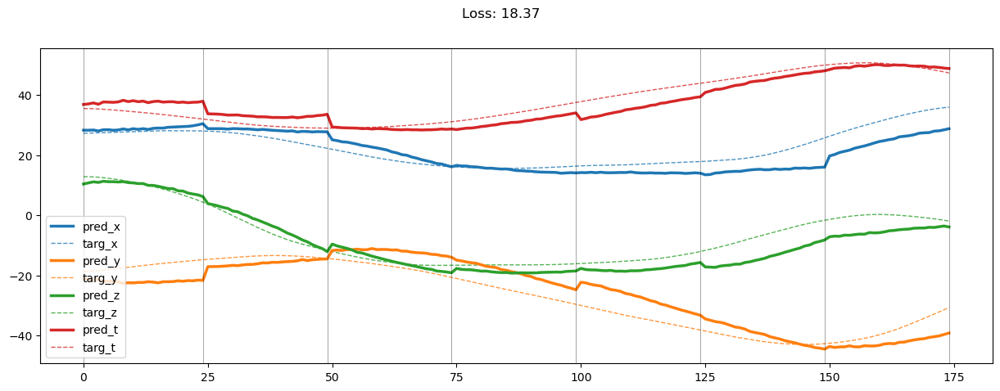

01600: train loss:  15.319, imu loss:  0.677, mag loss:  2.636, div loss:  5.237, slim:  4.364, tlim:  1.301
       valid loss:  185.212, imu loss:  0.509, mag loss:  53.497, div loss:  68.433, slim:  5.034, tlim:  4.505
01620: train loss:  15.198, imu loss:  0.673, mag loss:  2.603, div loss:  5.187, slim:  4.406, tlim:  1.285
       valid loss:  188.426, imu loss:  0.510, mag loss:  54.473, div loss:  69.678, slim:  5.058, tlim:  4.509
01640: train loss:  15.106, imu loss:  0.680, mag loss:  2.590, div loss:  5.141, slim:  4.377, tlim:  1.277
       valid loss:  191.080, imu loss:  0.509, mag loss:  55.478, div loss:  70.365, slim:  5.068, tlim:  4.476
01660: train loss:  14.905, imu loss:  0.675, mag loss:  2.540, div loss:  5.067, slim:  4.365, tlim:  1.267
       valid loss:  188.428, imu loss:  0.510, mag loss:  54.807, div loss:  69.024, slim:  5.038, tlim:  4.507
01680: train loss:  14.845, imu loss:  0.674, mag loss:  2.522, div loss:  5.027, slim:  4.370, tlim:  1.277
       

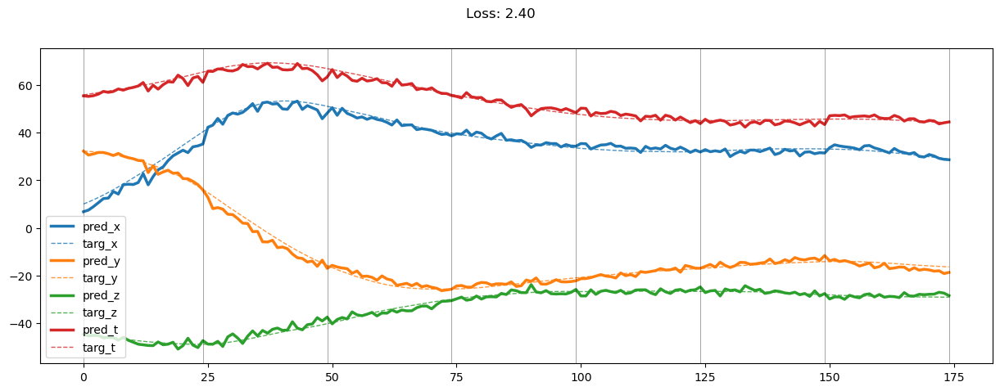

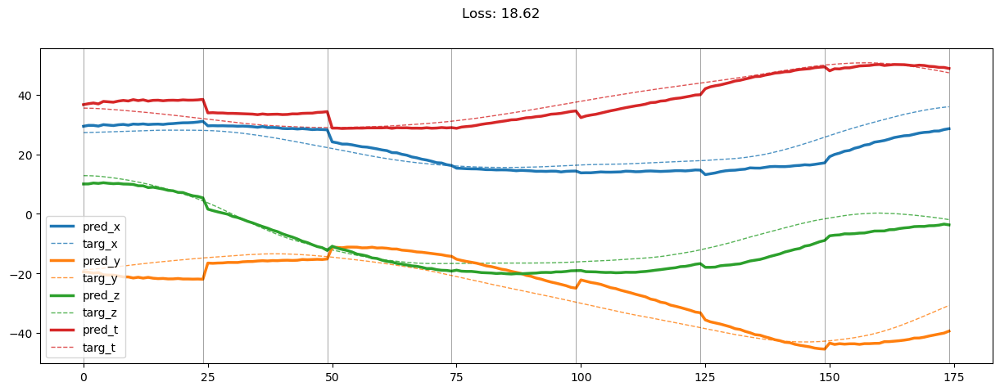

01800: train loss:  13.994, imu loss:  0.674, mag loss:  2.332, div loss:  4.653, slim:  4.363, tlim:  1.214
       valid loss:  193.458, imu loss:  0.510, mag loss:  56.616, div loss:  70.491, slim:  5.058, tlim:  4.464
01820: train loss:  13.914, imu loss:  0.672, mag loss:  2.323, div loss:  4.609, slim:  4.347, tlim:  1.209
       valid loss:  193.133, imu loss:  0.510, mag loss:  55.683, div loss:  71.742, slim:  5.176, tlim:  4.618
01840: train loss:  13.823, imu loss:  0.670, mag loss:  2.292, div loss:  4.559, slim:  4.365, tlim:  1.218
       valid loss:  191.058, imu loss:  0.510, mag loss:  55.310, div loss:  70.588, slim:  5.095, tlim:  4.528
01860: train loss:  13.643, imu loss:  0.672, mag loss:  2.253, div loss:  4.493, slim:  4.362, tlim:  1.194
       valid loss:  187.136, imu loss:  0.510, mag loss:  54.257, div loss:  68.736, slim:  5.100, tlim:  4.551
01880: train loss:  13.536, imu loss:  0.674, mag loss:  2.232, div loss:  4.441, slim:  4.337, tlim:  1.192
       

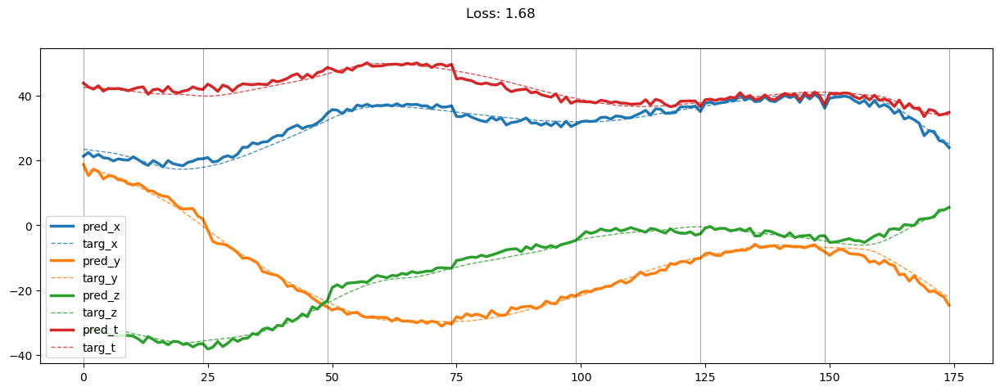

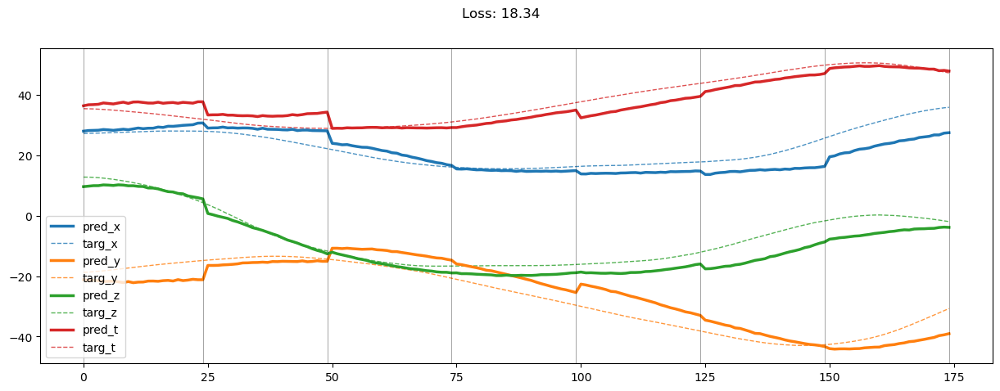

02000: train loss:  12.980, imu loss:  0.674, mag loss:  2.102, div loss:  4.192, slim:  4.372, tlim:  1.149
       valid loss:  190.601, imu loss:  0.510, mag loss:  55.178, div loss:  70.322, slim:  5.097, tlim:  4.576
02020: train loss:  12.983, imu loss:  0.667, mag loss:  2.106, div loss:  4.195, slim:  4.376, tlim:  1.146
       valid loss:  189.155, imu loss:  0.510, mag loss:  54.520, div loss:  70.026, slim:  5.239, tlim:  4.639
02040: train loss:  12.854, imu loss:  0.673, mag loss:  2.086, div loss:  4.123, slim:  4.334, tlim:  1.147
       valid loss:  188.191, imu loss:  0.510, mag loss:  54.713, div loss:  68.893, slim:  5.119, tlim:  4.535
02060: train loss:  12.824, imu loss:  0.669, mag loss:  2.074, div loss:  4.108, slim:  4.360, tlim:  1.146
       valid loss:  192.506, imu loss:  0.510, mag loss:  55.989, div loss:  70.578, slim:  5.152, tlim:  4.576
02080: train loss:  12.656, imu loss:  0.678, mag loss:  2.029, div loss:  4.056, slim:  4.337, tlim:  1.130
       

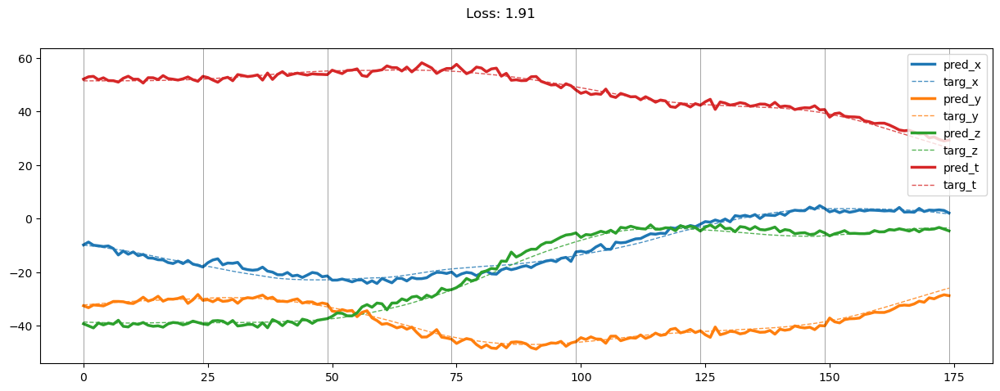

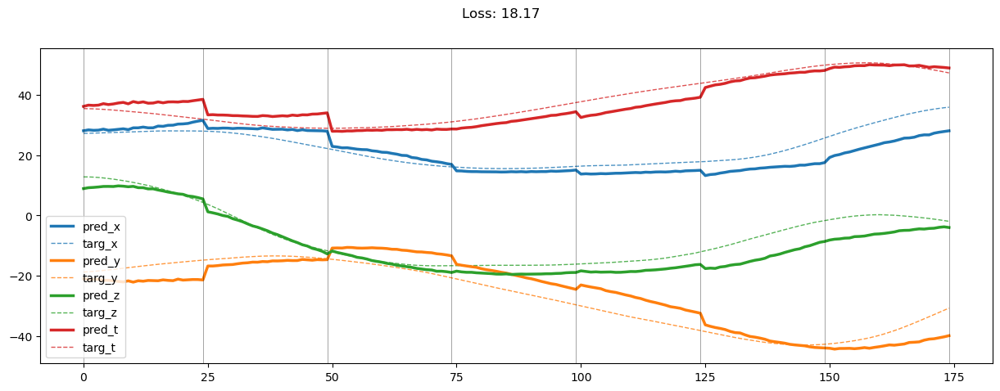

02200: train loss:  12.171, imu loss:  0.671, mag loss:  1.930, div loss:  3.845, slim:  4.305, tlim:  1.096
       valid loss:  188.633, imu loss:  0.510, mag loss:  54.640, div loss:  69.408, slim:  5.154, tlim:  4.572
02220: train loss:  12.222, imu loss:  0.672, mag loss:  1.937, div loss:  3.865, slim:  4.328, tlim:  1.097
       valid loss:  194.370, imu loss:  0.510, mag loss:  56.490, div loss:  71.317, slim:  5.260, tlim:  4.621
02240: train loss:  12.075, imu loss:  0.666, mag loss:  1.907, div loss:  3.797, slim:  4.335, tlim:  1.087
       valid loss:  192.584, imu loss:  0.510, mag loss:  55.628, div loss:  71.324, slim:  5.218, tlim:  4.590
02260: train loss:  12.129, imu loss:  0.673, mag loss:  1.921, div loss:  3.822, slim:  4.310, tlim:  1.092
       valid loss:  194.981, imu loss:  0.510, mag loss:  56.193, div loss:  72.417, slim:  5.249, tlim:  4.695
02280: train loss:  11.932, imu loss:  0.667, mag loss:  1.868, div loss:  3.721, slim:  4.345, tlim:  1.089
       

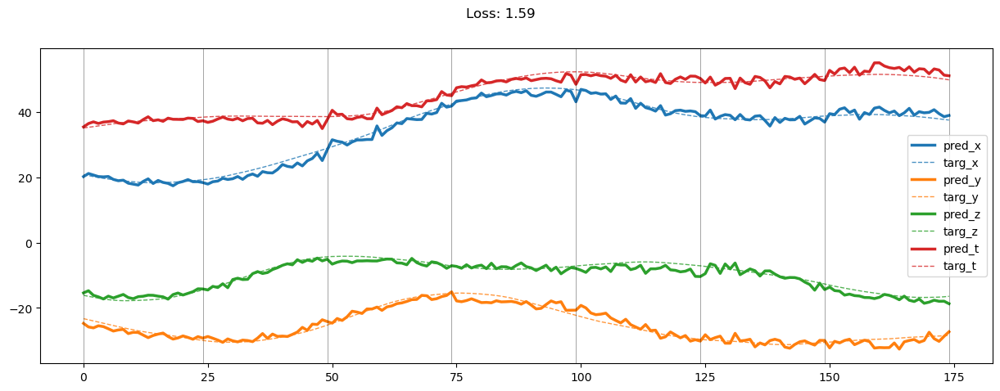

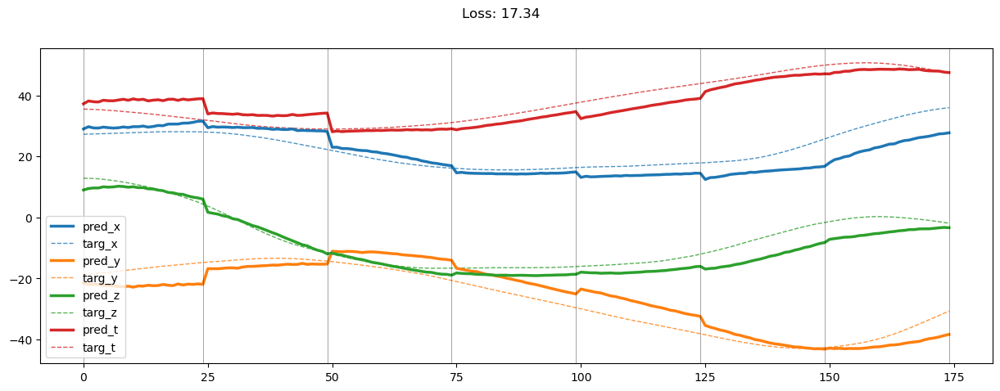

02400: train loss:  11.595, imu loss:  0.673, mag loss:  1.791, div loss:  3.572, slim:  4.369, tlim:  1.056
       valid loss:  194.581, imu loss:  0.510, mag loss:  55.919, div loss:  72.489, slim:  5.283, tlim:  4.735
02420: train loss:  11.582, imu loss:  0.677, mag loss:  1.788, div loss:  3.558, slim:  4.379, tlim:  1.055
       valid loss:  199.250, imu loss:  0.510, mag loss:  57.913, div loss:  73.154, slim:  5.293, tlim:  4.742
02440: train loss:  11.500, imu loss:  0.669, mag loss:  1.774, div loss:  3.543, slim:  4.341, tlim:  1.046
       valid loss:  197.061, imu loss:  0.510, mag loss:  57.555, div loss:  71.684, slim:  5.307, tlim:  4.736
02460: train loss:  11.417, imu loss:  0.669, mag loss:  1.756, div loss:  3.502, slim:  4.347, tlim:  1.041
       valid loss:  198.499, imu loss:  0.510, mag loss:  57.263, div loss:  73.579, slim:  5.350, tlim:  4.806
02480: train loss:  11.310, imu loss:  0.672, mag loss:  1.731, div loss:  3.453, slim:  4.342, tlim:  1.034
       

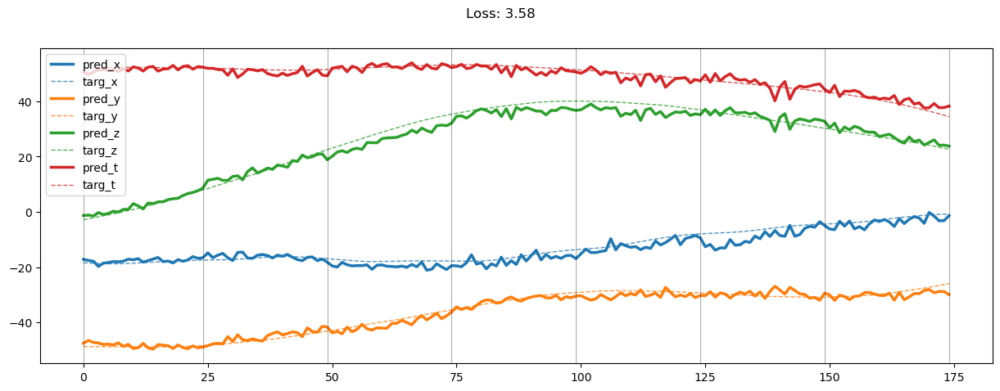

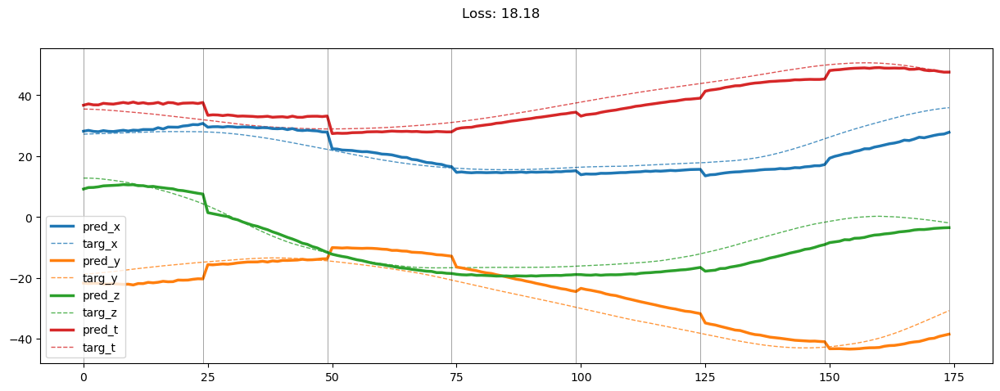

02600: train loss:  11.048, imu loss:  0.666, mag loss:  1.674, div loss:  3.348, slim:  4.322, tlim:  1.016
       valid loss:  198.648, imu loss:  0.511, mag loss:  57.390, div loss:  73.415, slim:  5.373, tlim:  4.837
02620: train loss:  10.870, imu loss:  0.660, mag loss:  1.638, div loss:  3.264, slim:  4.319, tlim:  1.007
       valid loss:  204.586, imu loss:  0.511, mag loss:  58.979, div loss:  76.186, slim:  5.379, tlim:  4.828
02640: train loss:  10.903, imu loss:  0.669, mag loss:  1.649, div loss:  3.272, slim:  4.329, tlim:  1.000
       valid loss:  200.821, imu loss:  0.511, mag loss:  58.126, div loss:  74.068, slim:  5.381, tlim:  4.866
02660: train loss:  10.884, imu loss:  0.668, mag loss:  1.636, div loss:  3.264, slim:  4.352, tlim:  1.003
       valid loss:  203.038, imu loss:  0.511, mag loss:  58.892, div loss:  74.642, slim:  5.429, tlim:  4.925
02680: train loss:  10.868, imu loss:  0.667, mag loss:  1.636, div loss:  3.265, slim:  4.329, tlim:  0.999
       

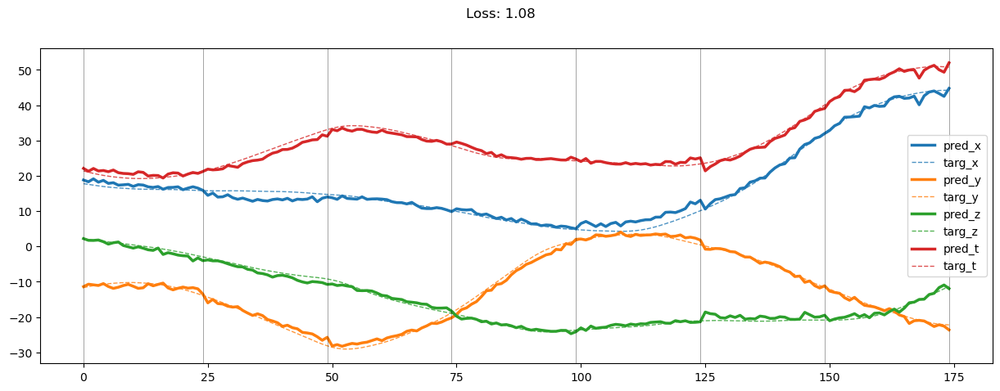

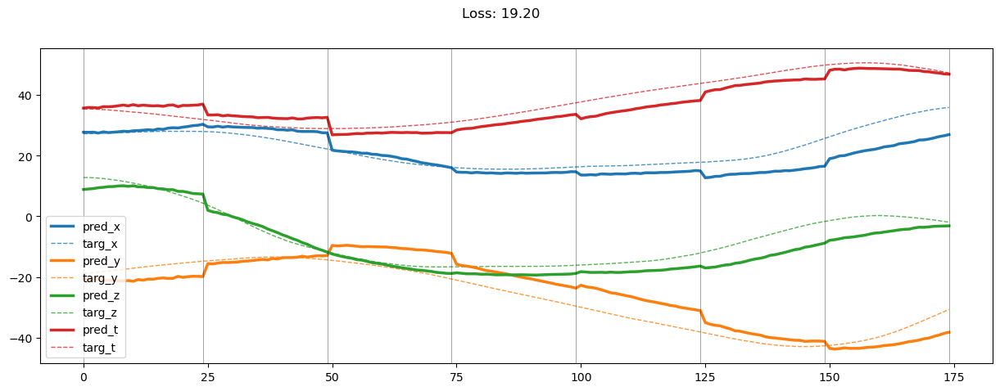

02800: train loss:  10.492, imu loss:  0.659, mag loss:  1.557, div loss:  3.107, slim:  4.293, tlim:  0.977
       valid loss:  201.770, imu loss:  0.512, mag loss:  58.196, div loss:  74.729, slim:  5.505, tlim:  4.923
02820: train loss:  10.437, imu loss:  0.662, mag loss:  1.542, div loss:  3.075, slim:  4.320, tlim:  0.971
       valid loss:  204.418, imu loss:  0.512, mag loss:  59.053, div loss:  75.655, slim:  5.456, tlim:  4.945
02840: train loss:  10.469, imu loss:  0.665, mag loss:  1.549, div loss:  3.095, slim:  4.313, tlim:  0.970
       valid loss:  204.715, imu loss:  0.512, mag loss:  59.319, div loss:  75.466, slim:  5.503, tlim:  4.898
02860: train loss:  10.465, imu loss:  0.664, mag loss:  1.549, div loss:  3.094, slim:  4.310, tlim:  0.970
       valid loss:  202.332, imu loss:  0.512, mag loss:  58.299, div loss:  75.274, slim:  5.446, tlim:  4.816
02880: train loss:  10.424, imu loss:  0.661, mag loss:  1.543, div loss:  3.077, slim:  4.303, tlim:  0.967
       

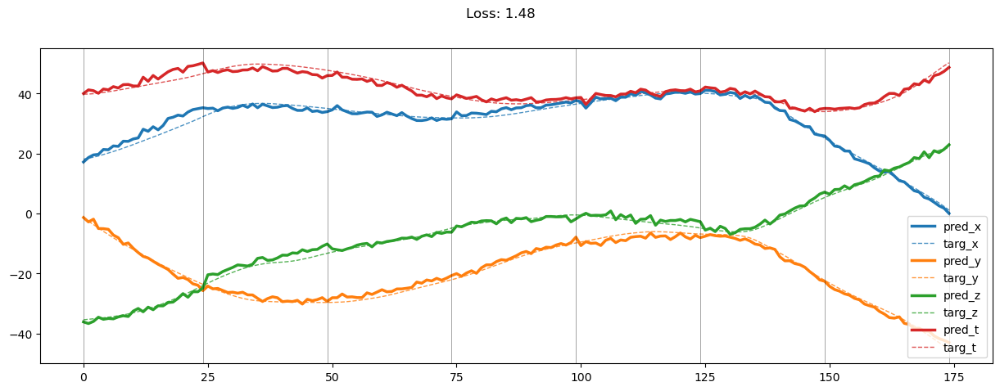

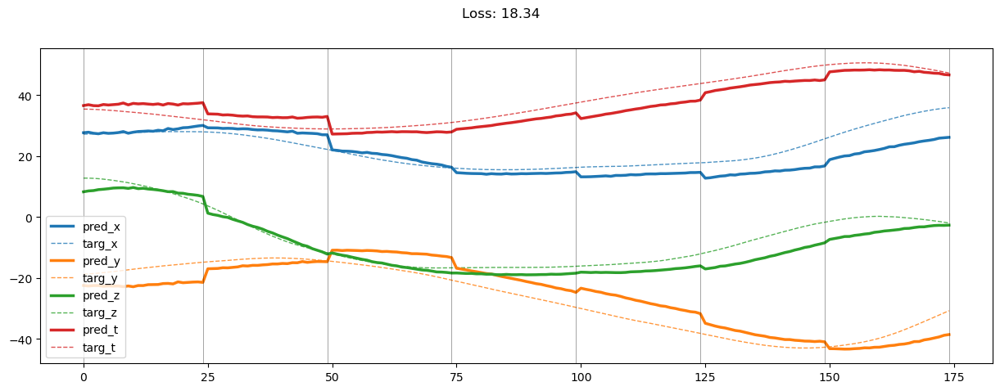

03000: train loss:  10.176, imu loss:  0.662, mag loss:  1.485, div loss:  2.962, slim:  4.329, tlim:  0.945
       valid loss:  203.394, imu loss:  0.512, mag loss:  59.037, div loss:  74.745, slim:  5.440, tlim:  4.895
03020: train loss:  10.058, imu loss:  0.658, mag loss:  1.459, div loss:  2.906, slim:  4.324, tlim:  0.942
       valid loss:  201.530, imu loss:  0.512, mag loss:  58.169, div loss:  74.537, slim:  5.491, tlim:  4.932
03040: train loss:  10.030, imu loss:  0.660, mag loss:  1.454, div loss:  2.899, slim:  4.311, tlim:  0.938
       valid loss:  206.361, imu loss:  0.512, mag loss:  59.569, div loss:  76.424, slim:  5.509, tlim:  5.021
03060: train loss:  10.049, imu loss:  0.656, mag loss:  1.460, div loss:  2.905, slim:  4.302, tlim:  0.945
       valid loss:  209.735, imu loss:  0.513, mag loss:  60.547, div loss:  77.874, slim:  5.534, tlim:  4.991
03080: train loss:  9.974, imu loss:  0.659, mag loss:  1.440, div loss:  2.859, slim:  4.334, tlim:  0.939
       v

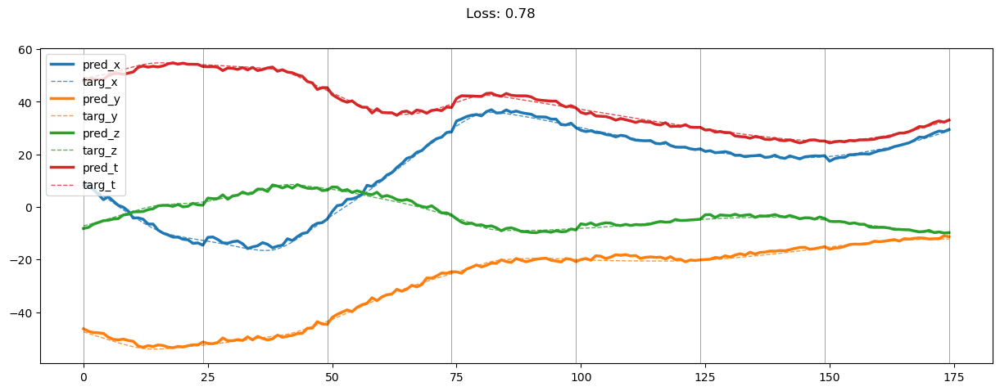

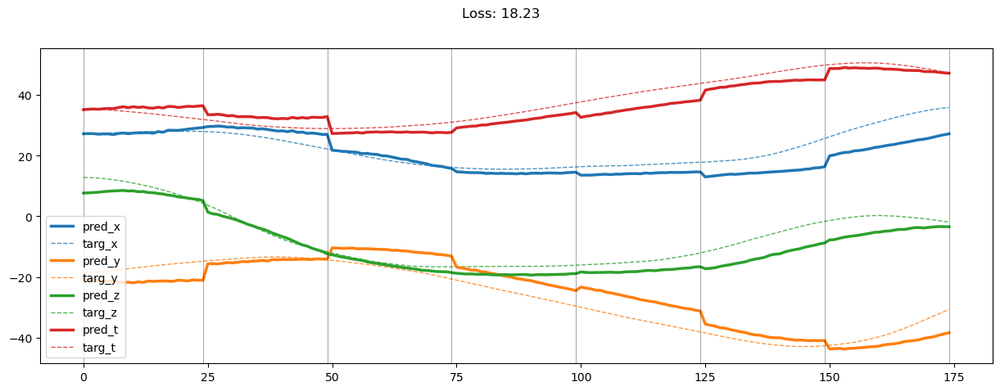

03200: train loss:  9.826, imu loss:  0.656, mag loss:  1.407, div loss:  2.811, slim:  4.331, tlim:  0.920
       valid loss:  206.693, imu loss:  0.513, mag loss:  59.640, div loss:  76.652, slim:  5.534, tlim:  4.987
03220: train loss:  9.815, imu loss:  0.666, mag loss:  1.404, div loss:  2.795, slim:  4.311, tlim:  0.926
       valid loss:  206.788, imu loss:  0.513, mag loss:  59.552, div loss:  76.999, slim:  5.488, tlim:  4.952
03240: train loss:  9.661, imu loss:  0.659, mag loss:  1.371, div loss:  2.731, slim:  4.329, tlim:  0.909
       valid loss:  206.079, imu loss:  0.514, mag loss:  59.563, div loss:  76.297, slim:  5.473, tlim:  4.937
03260: train loss:  9.698, imu loss:  0.654, mag loss:  1.386, div loss:  2.759, slim:  4.278, tlim:  0.916
       valid loss:  206.667, imu loss:  0.513, mag loss:  59.581, div loss:  76.867, slim:  5.495, tlim:  4.918
03280: train loss:  9.628, imu loss:  0.655, mag loss:  1.368, div loss:  2.729, slim:  4.293, tlim:  0.908
       valid

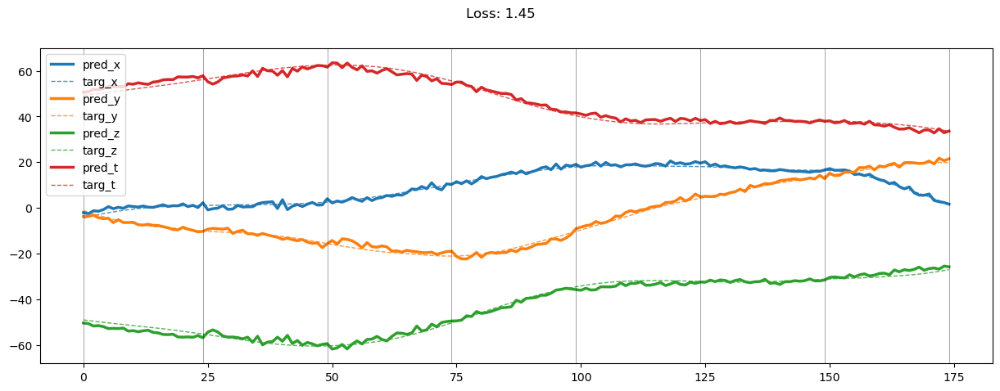

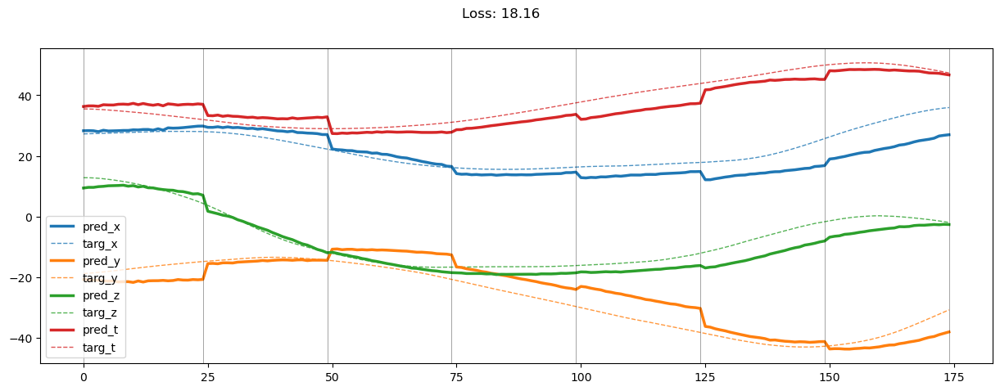

03400: train loss:  9.469, imu loss:  0.651, mag loss:  1.332, div loss:  2.663, slim:  4.313, tlim:  0.889
       valid loss:  210.662, imu loss:  0.515, mag loss:  61.078, div loss:  77.528, slim:  5.611, tlim:  5.106
03420: train loss:  9.501, imu loss:  0.655, mag loss:  1.338, div loss:  2.668, slim:  4.313, tlim:  0.898
       valid loss:  212.714, imu loss:  0.515, mag loss:  61.449, div loss:  78.686, slim:  5.693, tlim:  5.179
03440: train loss:  9.327, imu loss:  0.651, mag loss:  1.306, div loss:  2.601, slim:  4.286, tlim:  0.880
       valid loss:  209.508, imu loss:  0.515, mag loss:  60.565, div loss:  77.653, slim:  5.484, tlim:  4.978
03460: train loss:  9.401, imu loss:  0.652, mag loss:  1.321, div loss:  2.629, slim:  4.293, tlim:  0.888
       valid loss:  212.443, imu loss:  0.515, mag loss:  61.876, div loss:  77.771, slim:  5.646, tlim:  5.055
03480: train loss:  9.356, imu loss:  0.647, mag loss:  1.308, div loss:  2.610, slim:  4.293, tlim:  0.891
       valid

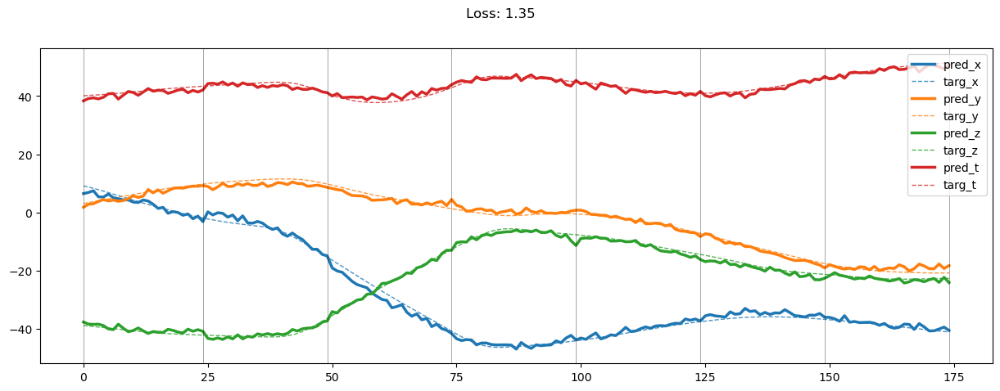

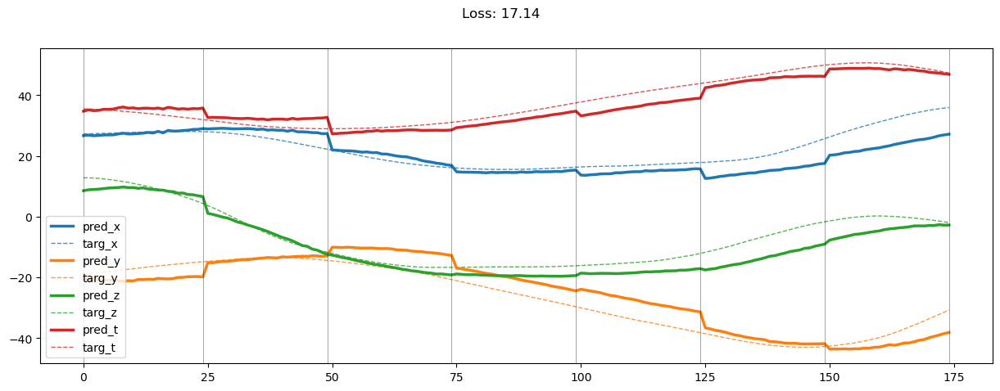

03600: train loss:  9.225, imu loss:  0.643, mag loss:  1.282, div loss:  2.557, slim:  4.307, tlim:  0.871
       valid loss:  213.541, imu loss:  0.516, mag loss:  61.292, div loss:  80.059, slim:  5.595, tlim:  5.056
03620: train loss:  9.153, imu loss:  0.647, mag loss:  1.270, div loss:  2.522, slim:  4.283, tlim:  0.869
       valid loss:  212.034, imu loss:  0.516, mag loss:  61.281, div loss:  78.513, slim:  5.630, tlim:  5.085
03640: train loss:  9.137, imu loss:  0.647, mag loss:  1.267, div loss:  2.514, slim:  4.274, tlim:  0.870
       valid loss:  217.106, imu loss:  0.516, mag loss:  62.506, div loss:  81.059, slim:  5.657, tlim:  5.127
03660: train loss:  9.164, imu loss:  0.645, mag loss:  1.269, div loss:  2.532, slim:  4.292, tlim:  0.869
       valid loss:  217.483, imu loss:  0.516, mag loss:  62.311, div loss:  81.726, slim:  5.683, tlim:  5.185
03680: train loss:  9.100, imu loss:  0.642, mag loss:  1.255, div loss:  2.495, slim:  4.299, tlim:  0.869
       valid

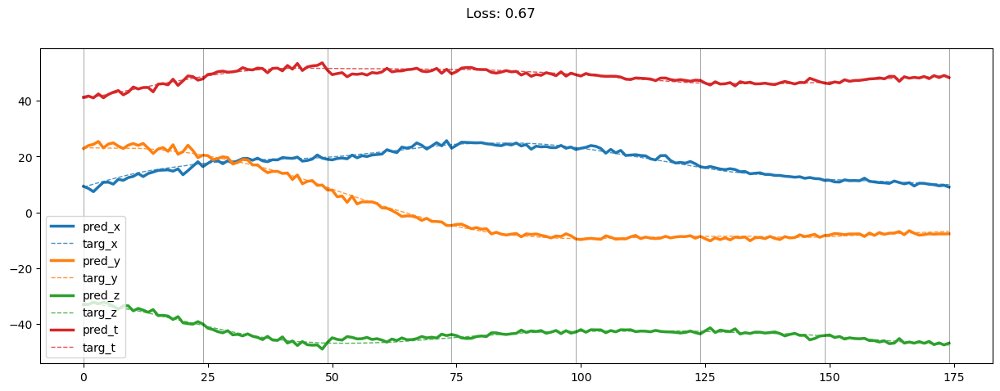

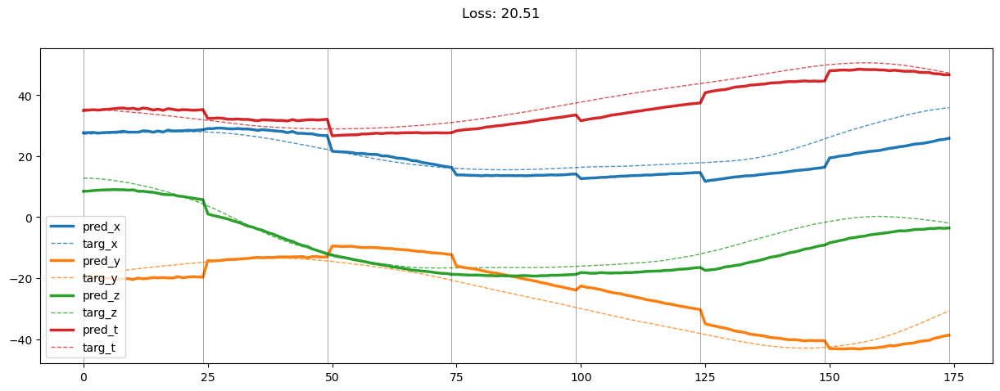

03800: train loss:  8.943, imu loss:  0.639, mag loss:  1.223, div loss:  2.436, slim:  4.287, tlim:  0.852
       valid loss:  214.522, imu loss:  0.517, mag loss:  61.912, div loss:  79.644, slim:  5.679, tlim:  5.132
03820: train loss:  8.929, imu loss:  0.639, mag loss:  1.222, div loss:  2.429, slim:  4.289, tlim:  0.848
       valid loss:  218.654, imu loss:  0.517, mag loss:  63.299, div loss:  81.018, slim:  5.657, tlim:  5.129
03840: train loss:  8.865, imu loss:  0.637, mag loss:  1.208, div loss:  2.402, slim:  4.270, tlim:  0.850
       valid loss:  214.684, imu loss:  0.517, mag loss:  61.795, div loss:  80.051, slim:  5.646, tlim:  5.135
03860: train loss:  8.896, imu loss:  0.644, mag loss:  1.210, div loss:  2.407, slim:  4.316, tlim:  0.845
       valid loss:  213.220, imu loss:  0.518, mag loss:  61.196, div loss:  79.629, slim:  5.732, tlim:  5.210
03880: train loss:  8.866, imu loss:  0.638, mag loss:  1.204, div loss:  2.402, slim:  4.312, tlim:  0.841
       valid

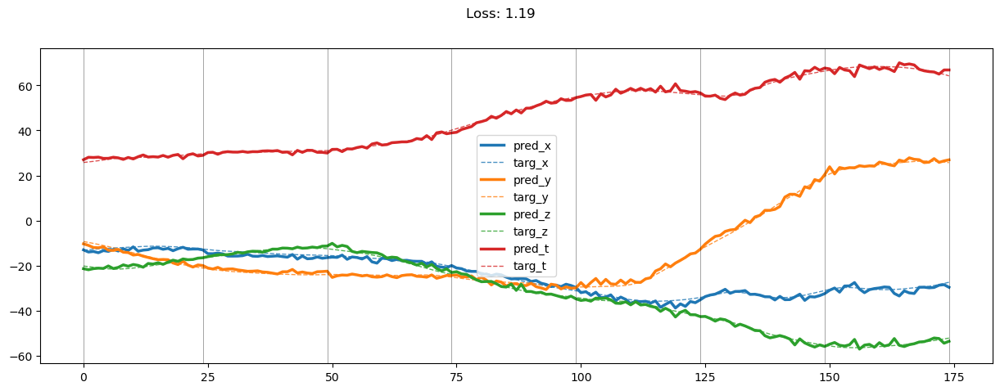

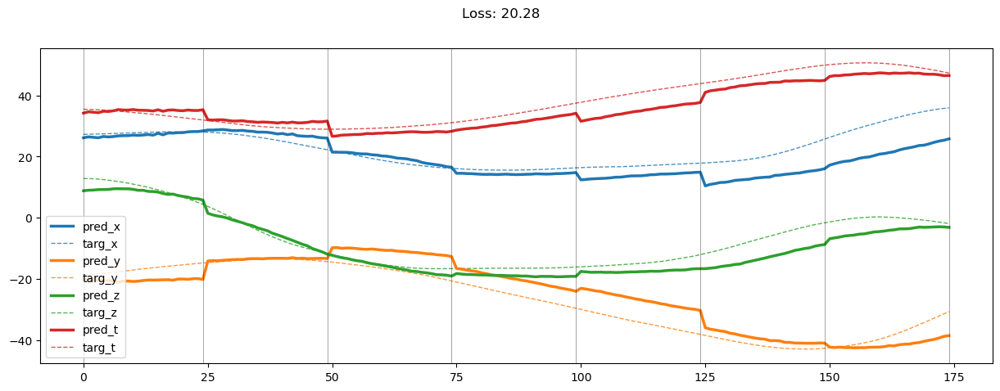

04000: train loss:  8.825, imu loss:  0.634, mag loss:  1.195, div loss:  2.374, slim:  4.322, tlim:  0.844
       valid loss:  222.812, imu loss:  0.518, mag loss:  64.187, div loss:  83.223, slim:  5.696, tlim:  5.232
04020: train loss:  8.753, imu loss:  0.635, mag loss:  1.184, div loss:  2.353, slim:  4.278, tlim:  0.839
       valid loss:  221.368, imu loss:  0.519, mag loss:  63.855, div loss:  82.430, slim:  5.713, tlim:  5.235
04040: train loss:  8.640, imu loss:  0.633, mag loss:  1.159, div loss:  2.309, slim:  4.278, tlim:  0.827
       valid loss:  222.334, imu loss:  0.518, mag loss:  63.896, div loss:  83.237, slim:  5.750, tlim:  5.275
04060: train loss:  8.642, imu loss:  0.637, mag loss:  1.156, div loss:  2.308, slim:  4.296, tlim:  0.825
       valid loss:  219.436, imu loss:  0.519, mag loss:  63.156, div loss:  81.940, slim:  5.740, tlim:  5.197
04080: train loss:  8.628, imu loss:  0.632, mag loss:  1.153, div loss:  2.305, slim:  4.292, tlim:  0.825
       valid

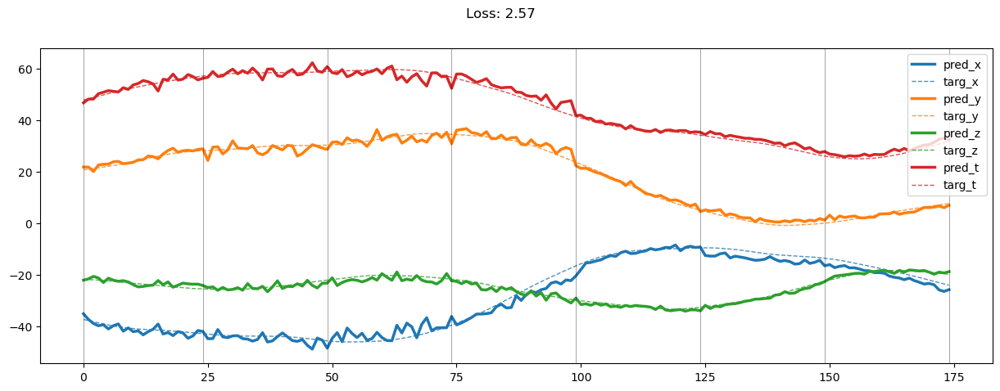

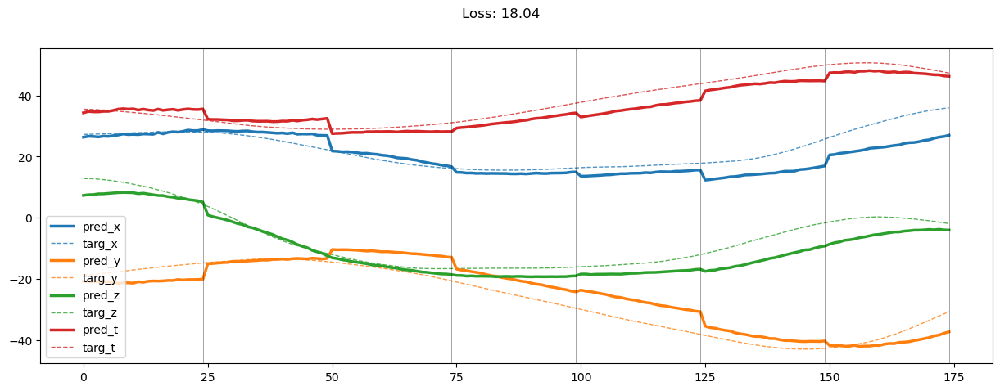

04200: train loss:  8.473, imu loss:  0.631, mag loss:  1.127, div loss:  2.237, slim:  4.252, tlim:  0.817
       valid loss:  217.442, imu loss:  0.519, mag loss:  62.388, div loss:  81.533, slim:  5.680, tlim:  5.182
04220: train loss:  8.496, imu loss:  0.626, mag loss:  1.127, div loss:  2.254, slim:  4.292, tlim:  0.811
       valid loss:  216.209, imu loss:  0.520, mag loss:  62.088, div loss:  81.048, slim:  5.611, tlim:  5.106
04240: train loss:  8.499, imu loss:  0.631, mag loss:  1.130, div loss:  2.263, slim:  4.247, tlim:  0.814
       valid loss:  219.431, imu loss:  0.520, mag loss:  63.320, div loss:  81.719, slim:  5.696, tlim:  5.137
04260: train loss:  8.449, imu loss:  0.625, mag loss:  1.117, div loss:  2.232, slim:  4.290, tlim:  0.809
       valid loss:  220.313, imu loss:  0.520, mag loss:  63.157, div loss:  82.677, slim:  5.719, tlim:  5.295
04280: train loss:  8.446, imu loss:  0.628, mag loss:  1.115, div loss:  2.220, slim:  4.311, tlim:  0.808
       valid

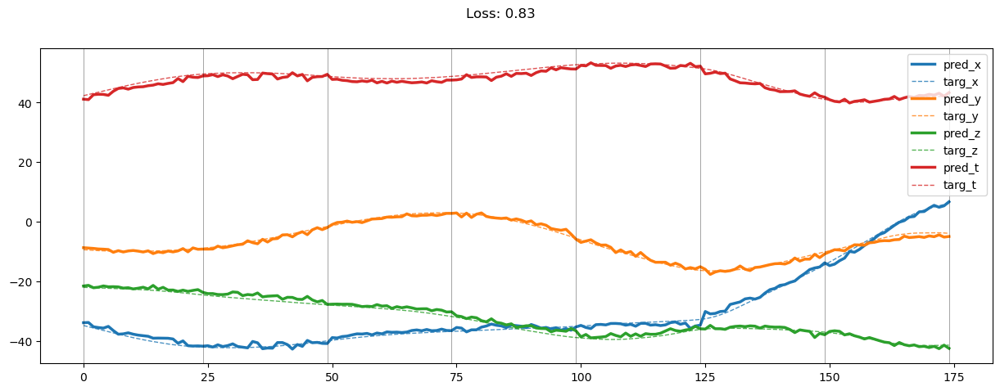

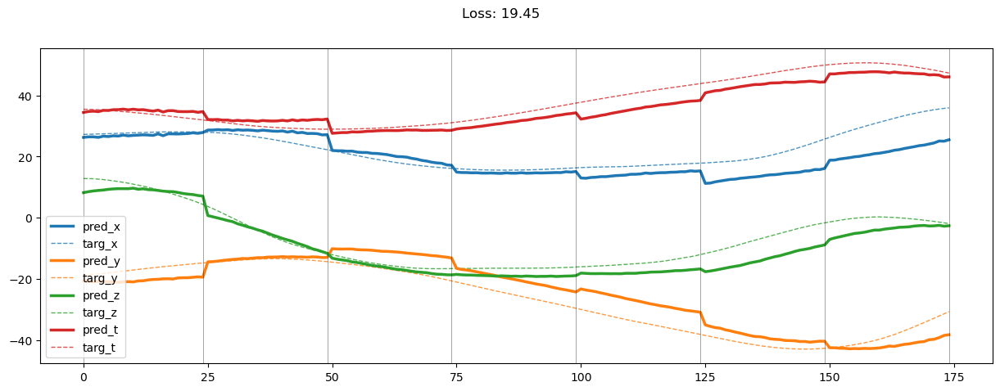

04400: train loss:  8.285, imu loss:  0.627, mag loss:  1.083, div loss:  2.158, slim:  4.289, tlim:  0.793
       valid loss:  222.714, imu loss:  0.521, mag loss:  63.643, div loss:  84.254, slim:  5.670, tlim:  5.213
04420: train loss:  8.278, imu loss:  0.624, mag loss:  1.080, div loss:  2.149, slim:  4.316, tlim:  0.792
       valid loss:  220.476, imu loss:  0.521, mag loss:  63.219, div loss:  82.907, slim:  5.671, tlim:  5.183
04440: train loss:  8.282, imu loss:  0.626, mag loss:  1.080, div loss:  2.154, slim:  4.310, tlim:  0.791
       valid loss:  223.783, imu loss:  0.522, mag loss:  64.050, div loss:  84.346, slim:  5.748, tlim:  5.294
04460: train loss:  8.262, imu loss:  0.630, mag loss:  1.076, div loss:  2.146, slim:  4.298, tlim:  0.791
       valid loss:  224.819, imu loss:  0.522, mag loss:  64.648, div loss:  84.184, slim:  5.764, tlim:  5.290
04480: train loss:  8.226, imu loss:  0.620, mag loss:  1.071, div loss:  2.136, slim:  4.280, tlim:  0.792
       valid

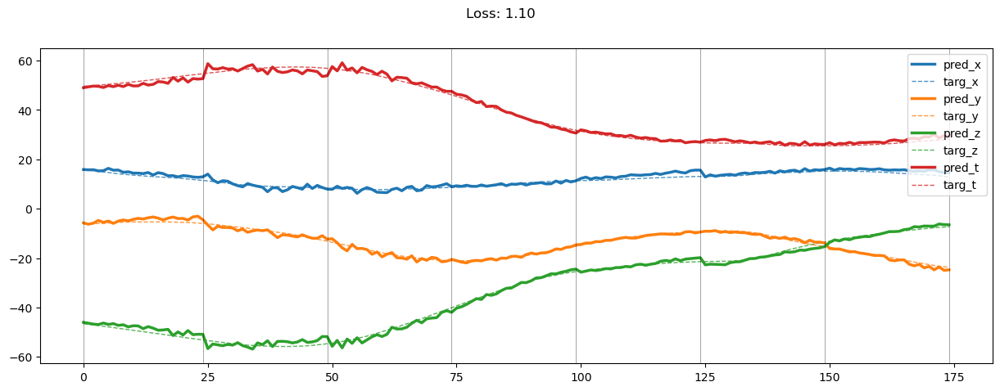

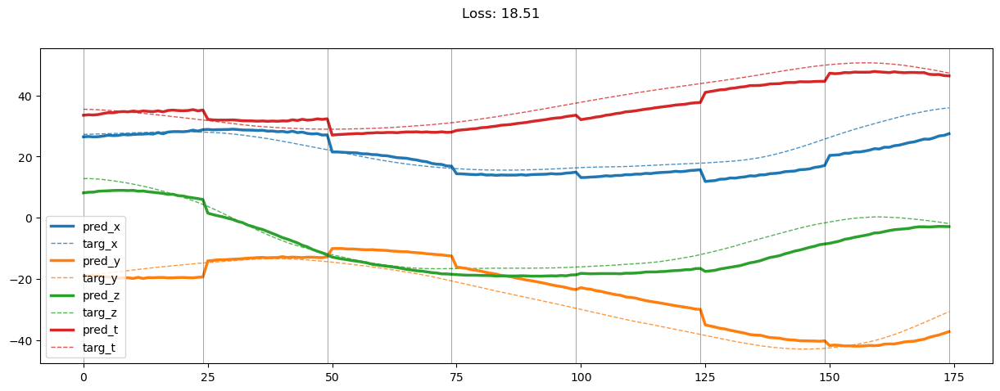

04600: train loss:  8.150, imu loss:  0.622, mag loss:  1.056, div loss:  2.106, slim:  4.277, tlim:  0.781
       valid loss:  225.492, imu loss:  0.523, mag loss:  64.231, div loss:  85.506, slim:  5.812, tlim:  5.397
04620: train loss:  8.139, imu loss:  0.621, mag loss:  1.055, div loss:  2.101, slim:  4.280, tlim:  0.778
       valid loss:  223.461, imu loss:  0.523, mag loss:  64.256, div loss:  83.725, slim:  5.695, tlim:  5.236
04640: train loss:  8.106, imu loss:  0.618, mag loss:  1.047, div loss:  2.085, slim:  4.279, tlim:  0.780
       valid loss:  226.353, imu loss:  0.522, mag loss:  65.348, div loss:  84.240, slim:  5.821, tlim:  5.323
04660: train loss:  8.128, imu loss:  0.614, mag loss:  1.048, div loss:  2.087, slim:  4.319, tlim:  0.782
       valid loss:  230.526, imu loss:  0.522, mag loss:  66.014, div loss:  86.888, slim:  5.862, tlim:  5.438
04680: train loss:  8.033, imu loss:  0.614, mag loss:  1.033, div loss:  2.058, slim:  4.262, tlim:  0.776
       valid

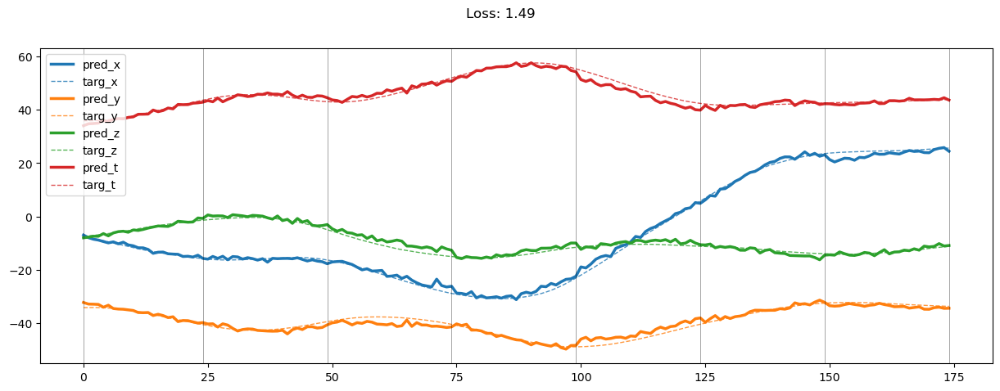

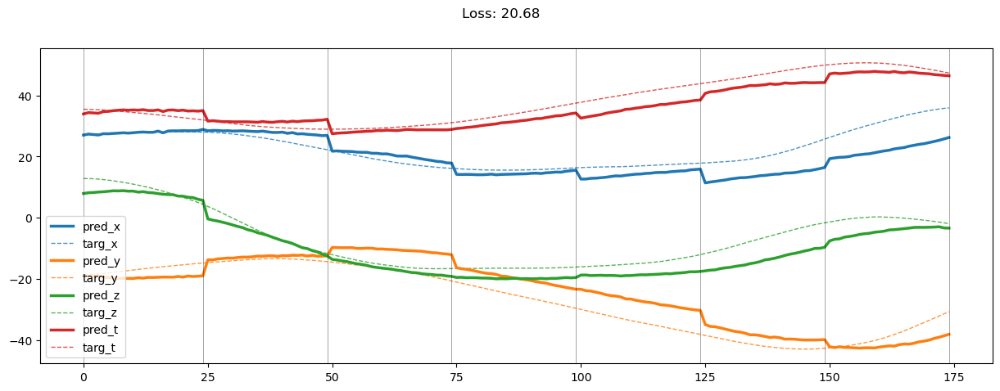

04800: train loss:  7.967, imu loss:  0.614, mag loss:  1.018, div loss:  2.025, slim:  4.288, tlim:  0.765
       valid loss:  224.544, imu loss:  0.524, mag loss:  64.306, div loss:  84.654, slim:  5.729, tlim:  5.260
04820: train loss:  7.966, imu loss:  0.617, mag loss:  1.019, div loss:  2.023, slim:  4.281, tlim:  0.766
       valid loss:  223.598, imu loss:  0.524, mag loss:  64.251, div loss:  83.730, slim:  5.763, tlim:  5.306
04840: train loss:  8.016, imu loss:  0.614, mag loss:  1.026, div loss:  2.038, slim:  4.316, tlim:  0.770
       valid loss:  223.393, imu loss:  0.524, mag loss:  63.613, div loss:  84.743, slim:  5.814, tlim:  5.329
04860: train loss:  7.904, imu loss:  0.611, mag loss:  1.008, div loss:  2.005, slim:  4.263, tlim:  0.761
       valid loss:  227.188, imu loss:  0.525, mag loss:  65.039, div loss:  85.656, slim:  5.834, tlim:  5.341
04880: train loss:  7.922, imu loss:  0.607, mag loss:  1.009, div loss:  2.017, slim:  4.282, tlim:  0.760
       valid

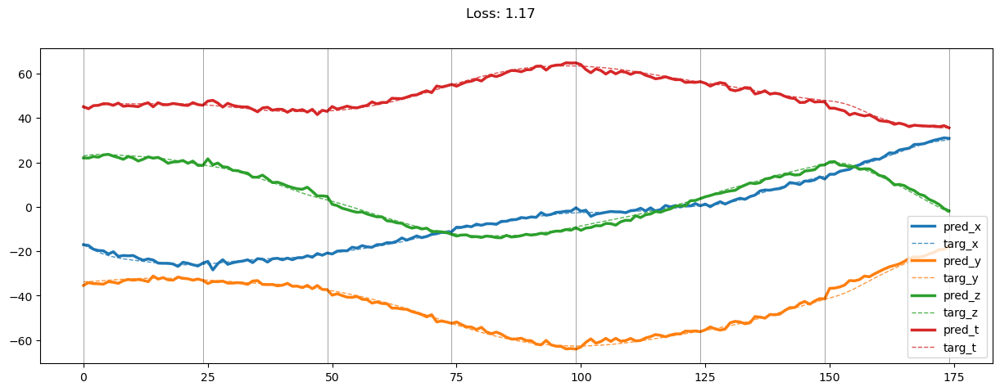

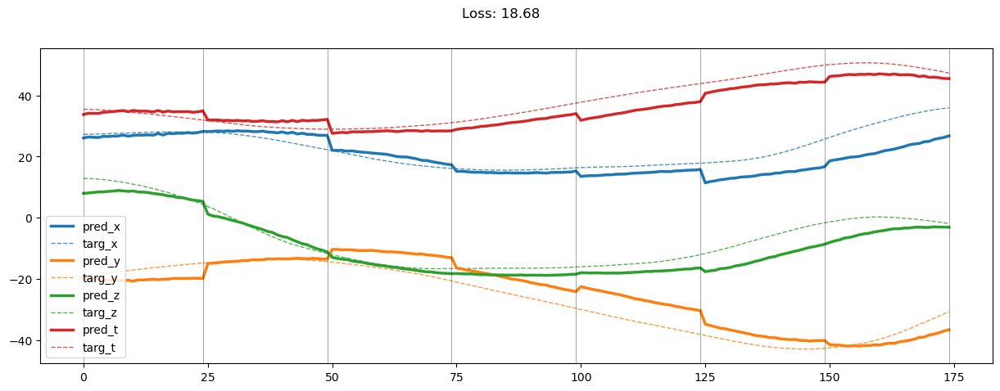

05000: train loss:  7.822, imu loss:  0.610, mag loss:  0.989, div loss:  1.970, slim:  4.268, tlim:  0.752
       valid loss:  229.319, imu loss:  0.526, mag loss:  65.070, div loss:  87.600, slim:  5.853, tlim:  5.418
05020: train loss:  7.910, imu loss:  0.602, mag loss:  1.014, div loss:  2.014, slim:  4.248, tlim:  0.761
       valid loss:  232.511, imu loss:  0.526, mag loss:  66.273, div loss:  88.303, slim:  5.863, tlim:  5.470
05040: train loss:  7.787, imu loss:  0.601, mag loss:  0.981, div loss:  1.961, slim:  4.268, tlim:  0.753
       valid loss:  228.136, imu loss:  0.527, mag loss:  65.113, div loss:  86.543, slim:  5.808, tlim:  5.291
05060: train loss:  7.851, imu loss:  0.600, mag loss:  0.998, div loss:  1.974, slim:  4.292, tlim:  0.757
       valid loss:  230.540, imu loss:  0.527, mag loss:  65.511, div loss:  87.819, slim:  5.920, tlim:  5.474
05080: train loss:  7.771, imu loss:  0.605, mag loss:  0.980, div loss:  1.950, slim:  4.274, tlim:  0.747
       valid

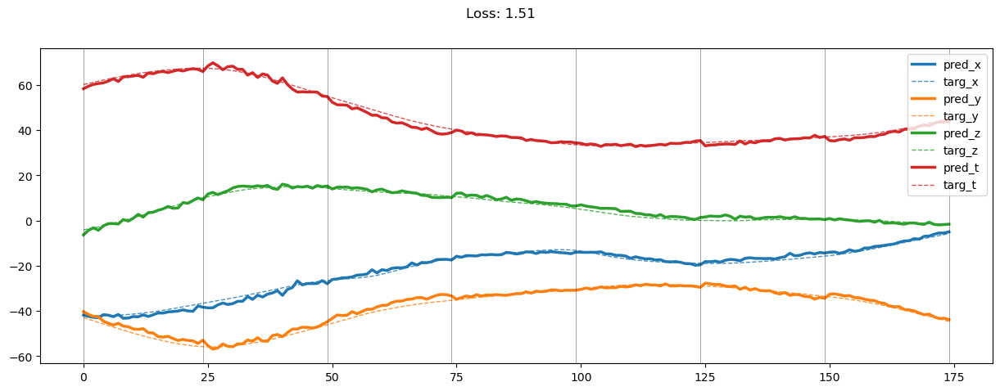

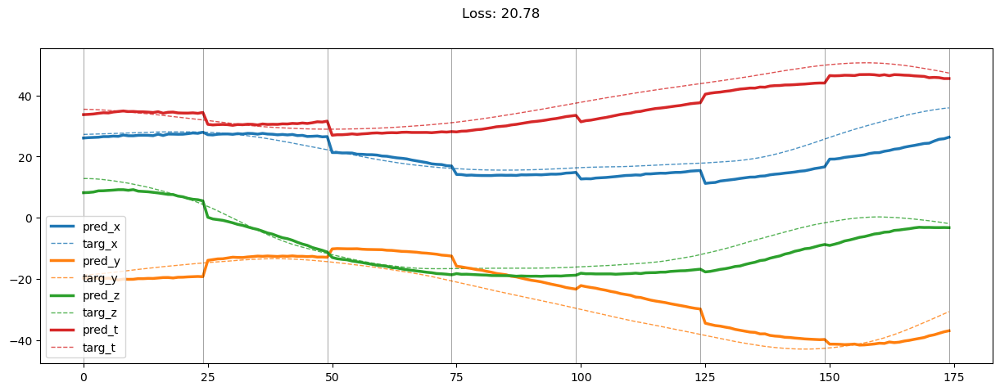

05200: train loss:  7.727, imu loss:  0.593, mag loss:  0.967, div loss:  1.930, slim:  4.315, tlim:  0.742
       valid loss:  231.601, imu loss:  0.528, mag loss:  65.877, div loss:  88.114, slim:  5.918, tlim:  5.496
05220: train loss:  7.731, imu loss:  0.598, mag loss:  0.970, div loss:  1.929, slim:  4.295, tlim:  0.744
       valid loss:  234.603, imu loss:  0.529, mag loss:  67.244, div loss:  88.496, slim:  5.874, tlim:  5.435
05240: train loss:  7.648, imu loss:  0.594, mag loss:  0.957, div loss:  1.903, slim:  4.257, tlim:  0.738
       valid loss:  230.951, imu loss:  0.529, mag loss:  65.878, div loss:  87.815, slim:  5.758, tlim:  5.315
05260: train loss:  7.687, imu loss:  0.595, mag loss:  0.958, div loss:  1.912, slim:  4.303, tlim:  0.742
       valid loss:  233.253, imu loss:  0.530, mag loss:  66.629, div loss:  88.412, slim:  5.844, tlim:  5.420
05280: train loss:  7.620, imu loss:  0.595, mag loss:  0.950, div loss:  1.894, slim:  4.252, tlim:  0.737
       valid

KeyboardInterrupt: 

In [33]:
draw = True

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 200 == 0:
        draw = True
    
    train_loss, train_imu_loss, train_mag_loss, t_d1_loss, tlim_loss = train(train_loader, draw)
    valid_loss, valid_imu_loss, valid_mag_loss, v_d1_loss, vlim_loss = evalute(valid_loader, draw)
    
    draw = False
    
    if (epoch + 1) % 20 == 0:
        ep = str(epoch + 1).zfill(5)
        print(f'{ep:>5}: train loss: {train_loss: 2.3f}, imu loss: {train_imu_loss: 2.3f}, mag loss: {train_mag_loss: 2.3f}, div loss: {t_d1_loss: 2.3f}, slim: {tlim_loss[0]: 2.3f}, tlim: {tlim_loss[1]: 2.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss: 2.3f}, imu loss: {valid_imu_loss: 2.3f}, mag loss: {valid_mag_loss: 2.3f}, div loss: {v_d1_loss: 2.3f}, slim: {vlim_loss[0]: 2.3f}, tlim: {vlim_loss[1]: 2.3f}')

In [34]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    class_results = []
    class_labels = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :, :6]
            source_mag = source_data[:, :, :, 6:9]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :, :6]
            target_mag = target_data[:, :, :, 6:9]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # generator loss
#             gen_loss, imu_loss, mag_loss = generator_loss(z_imu, target_imu, predict_mag, target_mag)

            # record loss
            predict_mag = predict_mag.detach().cpu().numpy()
            target_mag = target_mag.cpu().numpy()
            source_label = source_label.detach().cpu().numpy()
            
            results.extend(zip(predict_mag, target_mag, source_label))
            
            diff = np.power(predict_mag.reshape(len(predict_mag), -1, 3) - target_mag.reshape(len(target_mag), -1, 3), 2).mean(axis=1)
            class_results.extend(diff)
            class_labels.extend(source_label)
    
    return np.array(results, dtype=object), np.array(class_results), np.array(class_labels)

In [35]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    source_label = result[2]
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'{classes[source_label]}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

(5220, 3) (5220,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:     0.86     0.71     1.03     0.87
         pocket loss:     0.78     0.65     0.53     0.65
          swing loss:     0.83     0.59     0.58     0.66
        average loss:     0.82     0.65     0.72     0.73


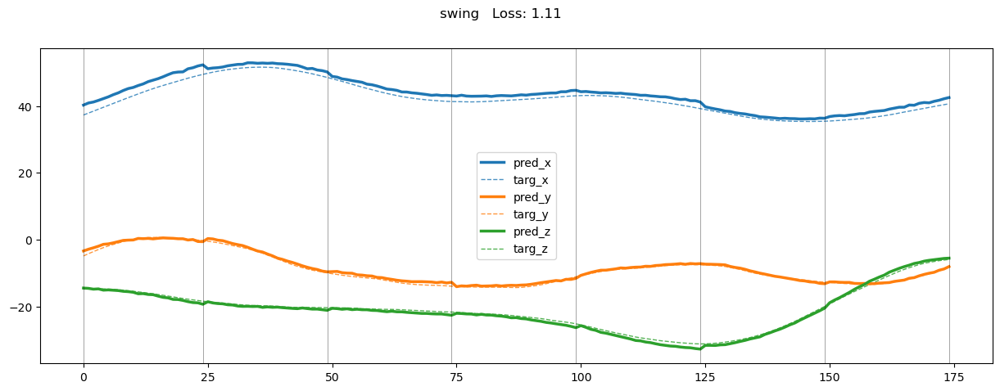

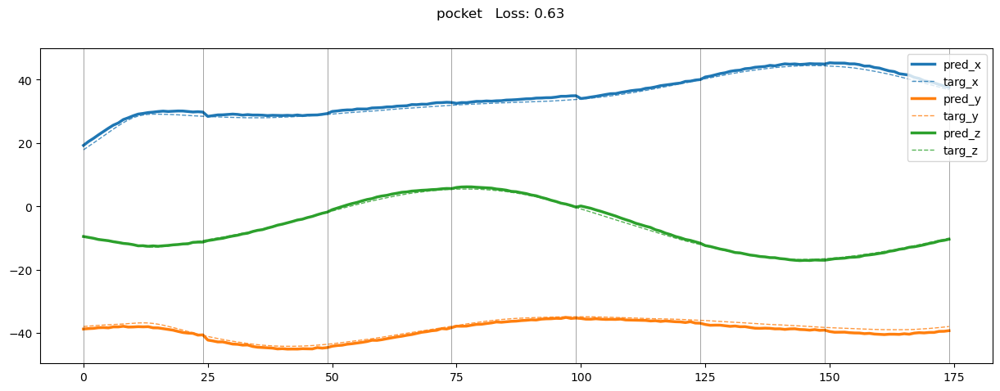

In [36]:
results, cres, clabel = output_eval(model, train_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::5000]:
    plot_result(rs)

(180, 3) (180,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    25.12    23.87    22.41    23.80
         pocket loss:    86.25   125.90    67.28    93.14
          swing loss:   125.78    85.17    57.69    89.55
        average loss:    76.80    75.14    47.68    66.54


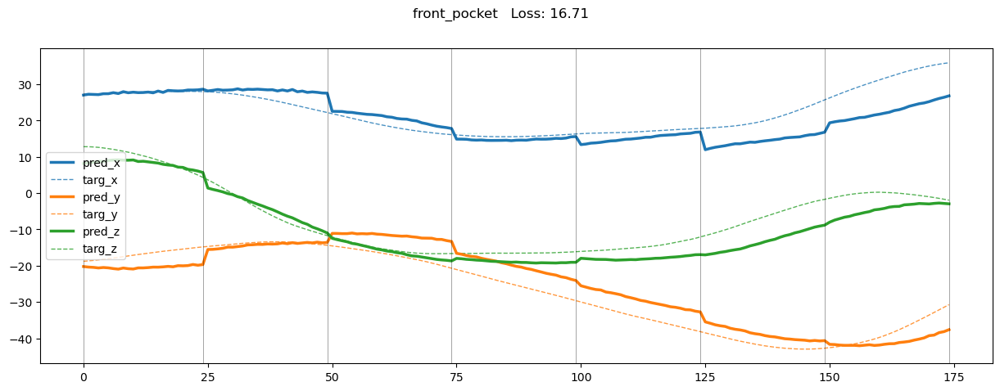

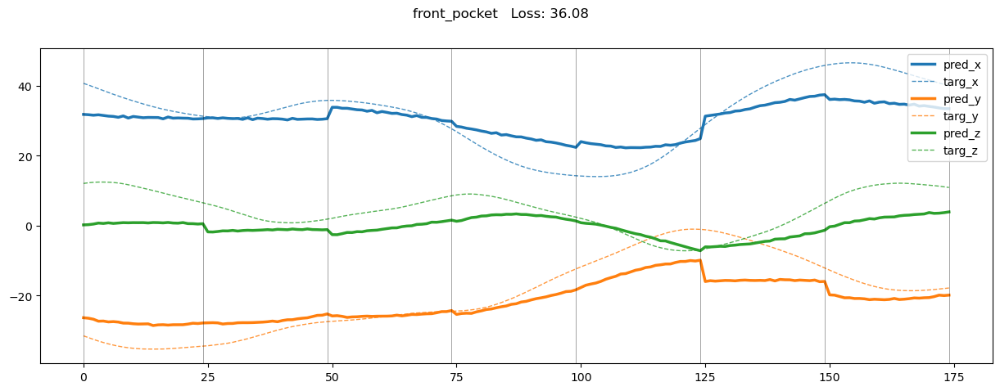

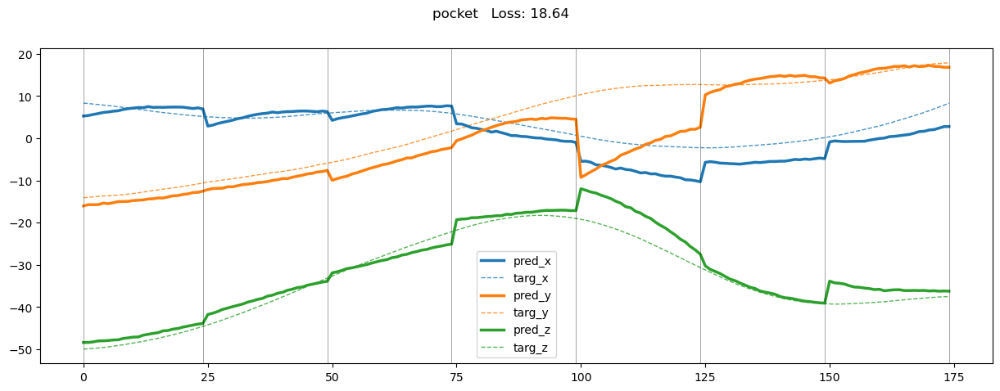

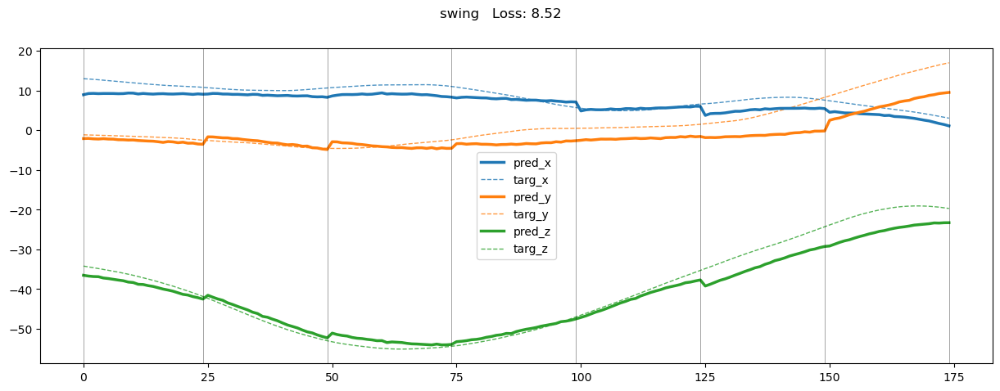

In [37]:
results, cres, clabel = output_eval(model, valid_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::50]:
    plot_result(rs)

In [38]:
def plot_eval_result(result, path):
    pred_mag = np.stack(results[:, 0], axis=0)[:, 0, 0].reshape(-1, 3)
    targ_mag = np.stack(results[:, 1], axis=0)[:, 0, 0].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(25, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{path}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [39]:
def load_data(folder_path):
    source_path = os.path.join(folder_path, 'source')
    target_path = os.path.join(folder_path, 'target')

    #########################
    ##### check devices #####
    #########################
    source_path, target_path = check_data_device(source_path, target_path)

    ####################################
    ##### load and preprocess data #####
    ####################################
    source_df = load_original_data(source_path)
    target_df = load_original_data(target_path)

    source_df, target_df = bound_range(source_df), bound_range(target_df)
    source_df, target_df = align_data(source_df, target_df)
    
    return select_data(source_df), select_data(target_df)

def split_data(df):
    total_length = chunk_size * seq_len
    
    segments = []
    for i in range(0, len(df) - total_length, 1):
        seg = df.iloc[i:i + total_length].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
    
    return np.array(segments)

def combine_to_dataloader(source, target):
    dataset = PairDataset(
                        source_data = torch.tensor(source, dtype=torch.float),
                        source_label = np.zeros(len(source)),
                        target_data = torch.tensor(target, dtype=torch.float),
                        target_label = np.zeros(len(target)),
                    )
    dataloader = DataLoader(dataset, batch_size=512, shuffle=False)
    
    return dataloader

def generate_dataloader(folder_path):
    source_df, target_df = load_data(folder_path)
    source_segs, target_segs = split_data(source_df), split_data(target_df)

    return combine_to_dataloader(source_segs, target_segs)

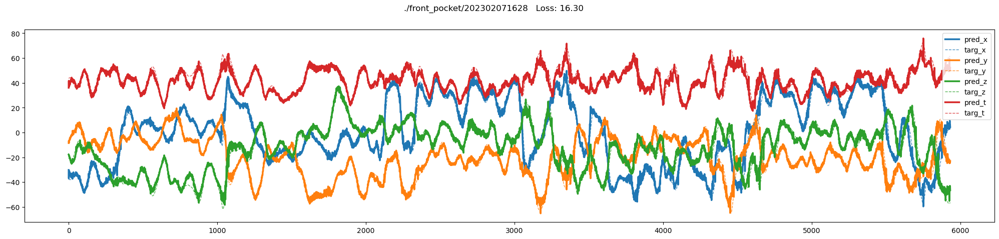

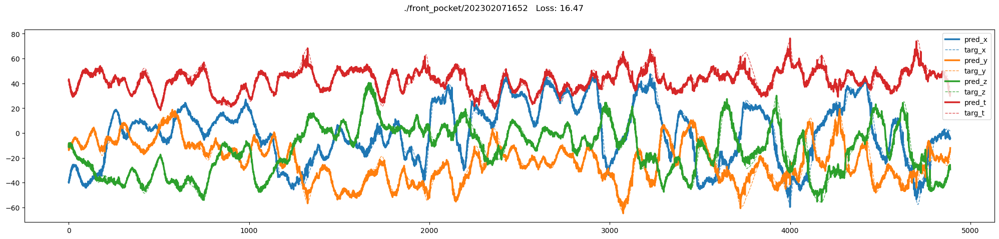

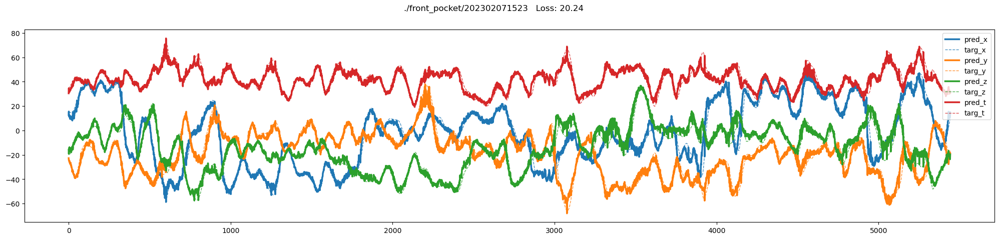

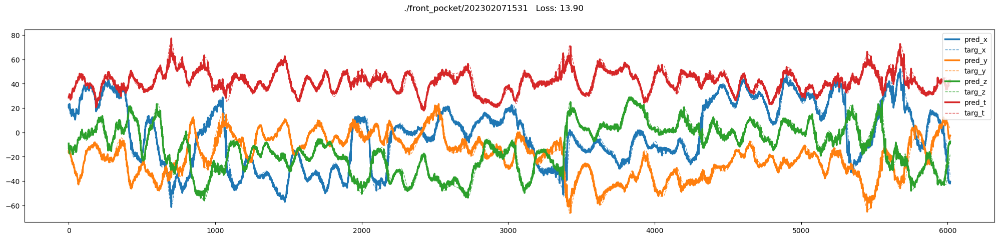

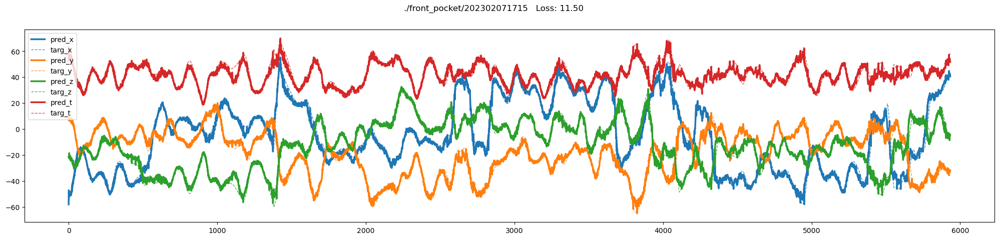

...

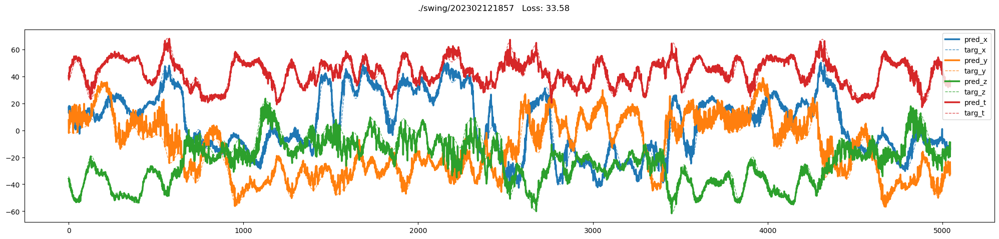

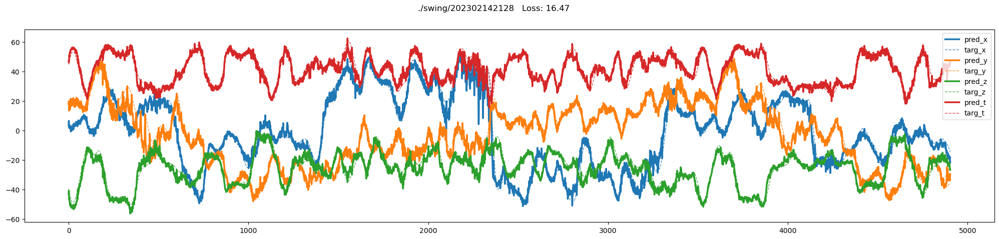

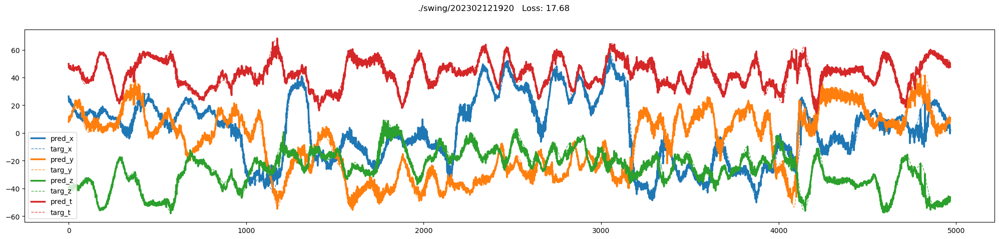

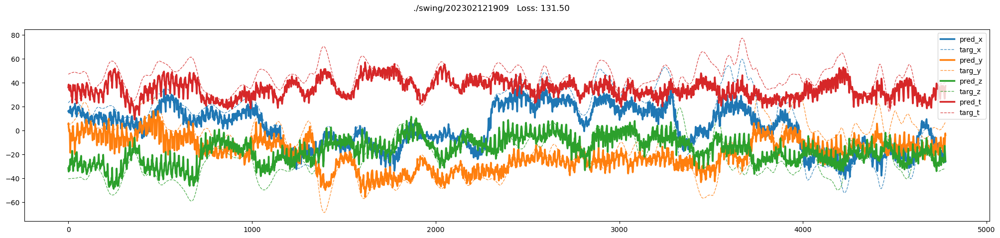

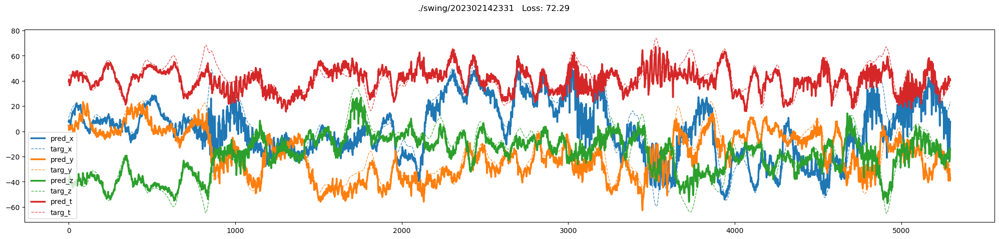

In [40]:
for folder in ['./front_pocket/*', './pocket/*', './swing/*']:
    for path in glob.glob(folder):
        eval_loader = generate_dataloader(path)
        results, _, _ = output_eval(model, eval_loader)
        plot_eval_result(results, path)